Copyright (c) 2021 Risklab Middle East - All Rights Reserved

**DISCLAIMER**

While the RiskLab Middle East team has done their best to provide top-notch algorithms to the world of finance, there is no guarantee about the results of running this code and implementing it for business purposes. A professional group of researchers creates the RiskLab team to develop and bring novel algorithm to solve different problems faced by financial institutions. Nonetheless, the author should be liable for any loss or damage. The code implemented here may not be suitable for your situation, and the risk associated with credit scoring is high. Please seek advice from professional experts before making any decisions.

Authors: Hamidreza Arian, Saeed Shadkam

In [ ]:
from google.colab import drive
from google.colab import files
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Main Functions: GM-SMOTE(Remove_Outliers + Oversampling) + CSGM + all the necessary libraries

**Remove_Outliers:**

This function classifies the observation based on their posterior probability. Observations with posterior probability less than (1 - threshold) are removed from the data.

Inputs:


*   data
*   n_components: Number of GMM clusters
*   threshold: The targert value of posterior probablity

Output:
*   It returns the denoised dataframe



In [ ]:
def Remove_Outliers(data, n_components= 1,threshold = 0.95, random_state = 42, plot = False):

  if threshold == 0:
    return data
  df_ones = data.loc[data.Default == 1,:]
  df_zeros = data.loc[data.Default != 1,:]


  mod = GMMOutlierDetector(n_components=n_components ,reg_covar=0.0001 ,threshold=threshold, random_state = random_state).fit(df_ones.iloc[:,:-1])
  Probability_ones = pd.Series(mod.predict(df_ones.iloc[:,:-1]), index = df_ones.index)
  denoised_ones = (Probability_ones == -1).sum()
  ratio_ones = 100 * (denoised_ones/len(Probability_ones))

  df_ones = df_ones.loc[Probability_ones == 1,:]

  mod = GMMOutlierDetector(n_components=n_components ,reg_covar=0.0001 ,threshold=threshold, random_state = random_state).fit(df_zeros.iloc[:,:-1])
  Probability_zeros = pd.Series(mod.predict(df_zeros.iloc[:,:-1]), index = df_zeros.index)
  denoised_zeros = (Probability_zeros == -1).sum()
  ratio_zeros = 100 * (denoised_zeros/len(Probability_zeros))


  if plot:
    sns.scatterplot(data=df_zeros.loc[Probability_zeros.replace([1, -1], [True, False]),:], x="RiskIndicator", y="PAY" , palette="deep", alpha=0.8, s=10)
    sns.scatterplot(data=df_zeros.loc[Probability_zeros.replace([-1, 1], [True, False]),:], x="RiskIndicator", y="PAY" , palette="deep", s=15, label= 'Outliers')
    sns.despine()
    plt.grid(False)
    plt.show()

  df_zeros = df_zeros.loc[Probability_zeros == 1,:]


  print('-----------------Denoising-----------------------')
  print('Zero Observations:',len(Probability_zeros) , 'Denoised:', denoised_zeros, 'Ratio:', ratio_zeros)
  print('Ones Observations:',len(Probability_ones) , 'Denoised:', denoised_ones, 'Ratio:', ratio_ones)

  data_denoised = pd.DataFrame( np.concatenate((df_zeros, df_ones), axis=0),columns = data.columns)
  data_denoised = data_denoised.sample(frac = 1, random_state= 42)

  return data_denoised

**Oversample_Minority:**

This function oversamples the minor class (zero labeled class) by first bitting the GMM, then getting random samples from the fitted distribution!

Inputs:



*   data
*   n_components: Number of GMM clusters

Output:


*   It returns a dataframe with balanced classes



In [ ]:
def Oversample_Minority(data,  n_components_res = 1,random_state = 42, plot = False):


  S = pd.DataFrame(columns = data.columns)

  print('------------- Over Sampling -------------')
  print('Number of Components:', n_components_res)
  print("Before oversampling")
  unique, counts = np.unique(data.Default, return_counts=True)
  print(dict(zip(unique, counts)))


  df_train_zeros = data.loc[data['Default'] == 0]
  df_train_ones = data.loc[data['Default'] != 0]
  gmm = GMM(n_components= n_components_res,reg_covar=0.001, random_state=random_state).fit(df_train_zeros.iloc[:,:-1])
  sample_number = len(df_train_ones) - len(df_train_zeros)

  # It generates more sample, because we are going to remove
  # samples with negative value of any features.
  sample, label = gmm.sample(n_samples=sample_number * 10)
  sample = pd.DataFrame(data = sample, columns= df_train_zeros.columns[:-1])
  sample['Default'] = 0
  sample = sample.loc[(((sample < 0).sum(1)) == 0),:]
  S = pd.DataFrame(np.concatenate((S, sample), axis=0), columns = data.columns)
  sample_number = sample_number - len(sample)
  if sample_number<0:
    S = S.iloc[(sample_number * (-1)):,:]
  if sample_number>0:
    raise ValueError("Not Enough sample generated!!")

  S.loc[:,['Default']] = 0
  data = pd.DataFrame( np.concatenate((S, df_train_ones, df_train_zeros), axis=0), columns = data.columns)
  data['Default'] = data['Default'].astype(int)
  #data = data.sample(frac = 1, random_state = random_state)


  print("After oversampling")
  unique, counts = np.unique(data.Default, return_counts=True)
  print(dict(zip(unique, counts)))
  if plot:
    #plt.ylim(0, 2500000)
    ax = sns.scatterplot(data=S, x="RiskIndicator", y="PAY", label = 'Synthetic', alpha=0.8, s=10)
    ax = sns.scatterplot(data=df_train_zeros, x="RiskIndicator", y="PAY", label = 'Real', alpha=0.5, s=10)
    plt.rcParams["figure.figsize"] = (12,12)
    plt.show()


  return data

In [ ]:
def CSGM(data, test, n_components, random_state = 42, covariance_type = 'full', plot = False):

  Nc = n_components
  ratios = np.zeros(shape=(Nc, 2))
  X_train, y_train = data.iloc[:,data.columns != 'Default'].values, data.iloc[:,data.columns == 'Default'].astype(int).values
  X_test, y_test = test.iloc[:,test.columns != 'Default'].values, test.iloc[:,test.columns == 'Default'].values


  gmm = GMM(n_components=Nc,covariance_type= covariance_type, random_state=random_state, reg_covar= 0.01).fit(np.array(X_train))

  y_train_pred = gmm.predict(np.array(X_train))
  print('Nc = ', Nc)
  s = 0
  for F in range(gmm.n_components):
    ratios[F, 1] = (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 1).sum()/\
          ((np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 1).sum() +\
          (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 0).sum())
    ratios[F, 0] = (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 0).sum() /\
          ((np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 1).sum() +\
          (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 0).sum())
    #print(' 1 to 0:', round(ratio, 2))
    if plot:
      print(' 1: ', ratios[F, 1])
      print(' 0: ', ratios[F, 0])
      print('---------------------------')
    if ratios[F, 1] >=  ratios[F, 0]:
      s += (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 1).sum()
    else:
      s += (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 0).sum()
  print('acc train: ', s/len(y_train))


  y_test_pred = gmm.predict(np.array(X_test))
  s = 0
  for F in range(gmm.n_components):
    ratio = (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 1).sum() /\
      (np.array(y_train)[np.where(y_train_pred==F)[0][:]] == 0).sum()
    #print(' 1 to 0:', round(ratio, 2))
    if plot:
      print(' 1: ', (np.array(y_test)[np.where(y_test_pred==F)[0][:]] == 1).sum()/((y_test_pred==F).sum()))
      print(' 0: ', (np.array(y_test)[np.where(y_test_pred==F)[0][:]] == 0).sum()/((y_test_pred==F).sum()))
      print('---------------------------')
    if ratio >= 1 :
      s += (np.array(y_test)[np.where(y_test_pred==F)[0][:]] == 1).sum()
    else:
      s += (np.array(y_test)[np.where(y_test_pred==F)[0][:]] == 0).sum()
  print('acc test: ', s/len(X_test))




  y_test_prob = gmm.predict_proba(np.array(X_test))
  t = ratios[:,1]

  prob = np.zeros(len(y_test_prob))
  for i in range(len(prob)):
      prob[i] = sum(y_test_prob[i]*t)
  if plot:
    plt.plot(prob, '.')

  AUC = get_roc(y_test, prob, plot)


  acc_test = 0
  threshold_test = 0
  y = 0
  for i in range(0, 1000):
    y = (prob >= (i/1000)).astype(int)
    acc = accuracy_score(y_test, y)
    if acc>=acc_test:
      acc_test = acc
      threshold_test = i/1000
      zeros = len(y) - y.sum()
      obs = len(y)

  y_train_prob = gmm.predict_proba(np.array(X_train))
  train_prob = np.zeros(len(y_train_prob))
  for i in range(len(train_prob)):
    train_prob[i]=sum(y_train_prob[i]*t)


  print('One to Zero Ratios: ', t)
  AUC_train = get_roc(y_train, train_prob)

  print('Train set Zeros probability mean', np.array(train_prob)[np.where(y_train==0)[0][:]].mean())
  print('Train set Ones probability mean', np.array(train_prob)[np.where(y_train==1)[0][:]].mean())
  print('Test set Zeros probability mean', np.array(prob)[np.where(y_test==0)[0][:]].mean())
  print('Test set Ones probability mean', np.array(prob)[np.where(y_test==1)[0][:]].mean())

  acc_train = 0
  threshold_train = 0
  y = 0
  for i in range(0, 100):
    y = (train_prob >= (i/100)).astype(int)
    acc = accuracy_score(y_train.astype(int), y)
    if acc>=acc_train:
      acc_train = acc
      threshold_train = i/100
      z = len(y) - y.sum()
      o = len(y)

  print('Train set: AUC =', AUC_train, '----Accuracy =', acc_train, '----Threshold =', 100 * threshold_train, 'Z:', z, 'O:', o)
  print('Test set: AUC =', AUC, '----Accuracy =', acc_test, '----Threshold =', 100 * threshold_test, 'Zeros =', zeros, 'out of:', obs)
  print('__________________________')
  return AUC, AUC_train, prob, train_prob, acc_test, threshold_test, acc_train, threshold_train

## Libraries

In [ ]:
import numpy as np
import pylab as pl
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import pydotplus
import itertools


import time
import matplotlib as mpl
from matplotlib.patches import Ellipse
from scipy import linalg
from IPython.display import Image
from collections import defaultdict
from sklearn.dummy import DummyClassifier
from sklearn.cluster import KMeans
from sklearn import svm, tree
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, VotingClassifier
from sklearn.feature_selection import RFE, SelectKBest, chi2, SelectFromModel
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
import datetime
from imblearn.over_sampling import SMOTENC
from scipy.stats import boxcox

In [ ]:
pip install scikit-lego

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 224 kB 13.3 MB/s 
     |████████████████████████████████| 88 kB 6.5 MB/s 
     |████████████████████████████████| 1.1 MB 39.3 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=a34395a9389c26285cf2a42686a0d2ce87c92c52563a7fa2c02ed68274524b0c
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=99bd236e62848762f3d8ede4bf50308d776d4d60646b9462dd59ee5f91c6752e
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [ ]:
from sklego.mixture import GMMOutlierDetector

In [ ]:
#sns.set_style('darkgrid')
sns.set_style("whitegrid")
plt.rc("figure", figsize=(9, 6))
plt.rc("savefig", dpi=90)
plt.rc("font",family="sans-serif")
plt.rc("font",size=14)

# Taiwanese Credit *Card*

## Data Cleaning + Categorical to Continuous

In [ ]:
filename = '/content/gdrive/My Drive/Credit Caard.xlsx'
data = pd.read_excel(filename).iloc[1:,1:]
print(data.shape)
print(data.columns)
data.head(5)

(29999, 24)
Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'Default'],
      dtype='object')


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
1,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0
5,50000,1,1,2,37,0,0,0,0,0,0,64400,57069,57608,19394,19619,20024,2500,1815,657,1000,1000,800,0


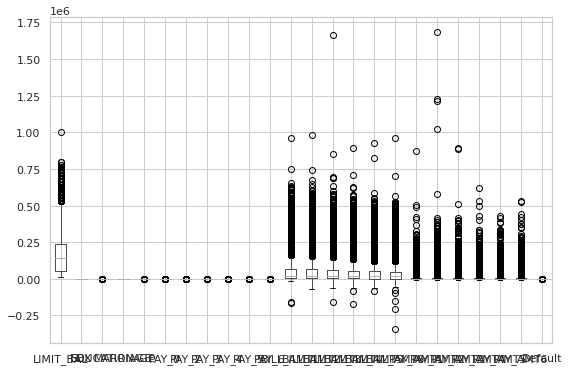

In [ ]:
data.boxplot()

In [ ]:
unique, counts = np.unique(data.Default, return_counts=True)
print(dict(zip(unique, counts)))

{0: 23364, 1: 6635}


In [ ]:
data['Default'] = data['Default'].replace([0,1],[1,0])

In [ ]:
data_train, data_test = train_test_split(data, test_size=0.3, random_state=42)

In [ ]:
for i in data_train.SEX.unique():
  r = (data_train.loc[data_train['SEX'] == i].Default.sum())/(len(data_train.loc[data_train['SEX'] == i].Default))
  data['SEX'] = data['SEX'].replace(i, r)
  print('SEX = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['SEX'] == i].Default)))
  print('___________________________________')

SEX =  2
Paid in Full Rate = 0.7913234486545854
Observations 12747
___________________________________
SEX =  1
Paid in Full Rate = 0.7596946194861852
Observations 8252
___________________________________


In [ ]:
for i in data_train.EDUCATION.unique():
  r = (data_train.loc[data_train['EDUCATION'] == i].Default.sum())/(len(data_train.loc[data_train['EDUCATION'] == i].Default))
  data['EDUCATION'] = data['EDUCATION'].replace(i, r)
  print('EDUCATION = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['EDUCATION'] == i].Default)))
  print('___________________________________')

EDUCATION =  3
Paid in Full Rate = 0.7496331083064279
Observations 3407
___________________________________
EDUCATION =  1
Paid in Full Rate = 0.8043331076506431
Observations 7385
___________________________________
EDUCATION =  2
Paid in Full Rate = 0.7643480024335835
Observations 9862
___________________________________
EDUCATION =  5
Paid in Full Rate = 0.9458128078817734
Observations 203
___________________________________
EDUCATION =  4
Paid in Full Rate = 0.9456521739130435
Observations 92
___________________________________
EDUCATION =  6
Paid in Full Rate = 0.868421052631579
Observations 38
___________________________________
EDUCATION =  0
Paid in Full Rate = 1.0
Observations 12
___________________________________


In [ ]:
for i in data_train.MARRIAGE.unique():
  r = (data_train.loc[data_train['MARRIAGE'] == i].Default.sum())/(len(data_train.loc[data_train['MARRIAGE'] == i].Default))
  data['MARRIAGE'] = data['MARRIAGE'].replace(i, r)
  print('MARRIAGE = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['MARRIAGE'] == i].Default)))
  print('___________________________________')

MARRIAGE =  1
Paid in Full Rate = 0.7652837287072839
Observations 9569
___________________________________
MARRIAGE =  2
Paid in Full Rate = 0.790935148692225
Observations 11164
___________________________________
MARRIAGE =  3
Paid in Full Rate = 0.73568281938326
Observations 227
___________________________________
MARRIAGE =  0
Paid in Full Rate = 0.9230769230769231
Observations 39
___________________________________


In [ ]:
for i in data_train.PAY_0.unique():
  r = (data_train.loc[data_train['PAY_0'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_0'] == i].Default))
  data['PAY_0'] = data['PAY_0'].replace(i, r)
  print('PAY_0 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['PAY_0'] == i].Default)))
  print('___________________________________')

PAY_0 =  -2
Paid in Full Rate = 0.867983367983368
Observations 1924
___________________________________
PAY_0 =  2
Paid in Full Rate = 0.315595363540569
Observations 1898
___________________________________
PAY_0 =  0
Paid in Full Rate = 0.8732462977396727
Observations 10264
___________________________________
PAY_0 =  1
Paid in Full Rate = 0.6571651698555252
Observations 2561
___________________________________
PAY_0 =  -1
Paid in Full Rate = 0.8299134734239803
Observations 4045
___________________________________
PAY_0 =  4
Paid in Full Rate = 0.3617021276595745
Observations 47
___________________________________
PAY_0 =  3
Paid in Full Rate = 0.22790697674418606
Observations 215
___________________________________
PAY_0 =  5
Paid in Full Rate = 0.5294117647058824
Observations 17
___________________________________
PAY_0 =  7
Paid in Full Rate = 0.0
Observations 5
___________________________________
PAY_0 =  8
Paid in Full Rate = 0.35714285714285715
Observations 14
__________________

In [ ]:
for i in data_train.PAY_2.unique():
  r = (data_train.loc[data_train['PAY_2'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_2'] == i].Default))
  data['PAY_2'] = data['PAY_2'].replace(i, r)

for i in data_train.PAY_3.unique():
  r = (data_train.loc[data_train['PAY_3'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_3'] == i].Default))
  data['PAY_3'] = data['PAY_3'].replace(i, r)

for i in data_train.PAY_4.unique():
  r = (data_train.loc[data_train['PAY_4'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_4'] == i].Default))
  data['PAY_4'] = data['PAY_4'].replace(i, r)

for i in data_train.PAY_5.unique():
  r = (data_train.loc[data_train['PAY_5'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_5'] == i].Default))
  data['PAY_5'] = data['PAY_5'].replace(i, r)

for i in data_train.PAY_6.unique():
  r = (data_train.loc[data_train['PAY_6'] == i].Default.sum())/(len(data_train.loc[data_train['PAY_6'] == i].Default))
  data['PAY_6'] = data['PAY_6'].replace(i, r)

In [ ]:
data['BILL_AMT1'] = data['BILL_AMT1'] + 350000
data['BILL_AMT2'] = data['BILL_AMT2'] + 350000
data['BILL_AMT3'] = data['BILL_AMT3'] + 350000
data['BILL_AMT4'] = data['BILL_AMT4'] + 350000
data['BILL_AMT5'] = data['BILL_AMT5'] + 350000
data['BILL_AMT6'] = data['BILL_AMT6'] + 350000

In [ ]:
data['PAY_AMT1'] = data['PAY_AMT1'] + 350000
data['PAY_AMT2'] = data['PAY_AMT2'] + 350000
data['PAY_AMT3'] = data['PAY_AMT3'] + 350000
data['PAY_AMT4'] = data['PAY_AMT4'] + 350000
data['PAY_AMT5'] = data['PAY_AMT5'] + 350000
data['PAY_AMT6'] = data['PAY_AMT6'] + 350000

In [ ]:
data['RiskIndicator'] = data['SEX'] + data['EDUCATION'] + data['MARRIAGE']
data['PAY'] = + data['PAY_0'] + data['PAY_2']+ data['PAY_3'] + data['PAY_4'] + data['PAY_5'] + data['PAY_6']

In [ ]:
data = data.drop(columns= ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4',\
                            'PAY_5', 'PAY_6'])

In [ ]:
data = data.loc[:,['AGE','LIMIT_BAL', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'RiskIndicator','PAY', 'Default']]

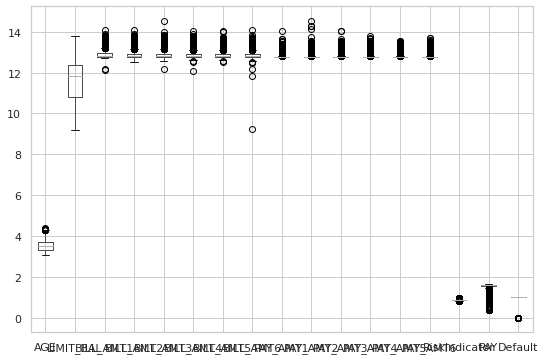

In [ ]:
for i in data.columns[:-1]:
  data.loc[:,i] = boxcox(data.loc[:,i],0)

data.boxplot()

In [ ]:
data_train, data_test = train_test_split(data, test_size=0.3, random_state=42)

In [ ]:
data_resampled = Oversample_Minority(data_train)
data_resampled_denoised = Remove_Outliers(data_resampled)

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 4643, 1: 16356}
After oversampling
{0: 16356, 1: 16356}
-----------------Denoising-----------------------
Zero Observations: 16356 Denoised: 818 Ratio: 5.00122279285889
Ones Observations: 16356 Denoised: 818 Ratio: 5.00122279285889


In [ ]:
data_resampled_denoised.RiskIndicator.mean()

0.8474982320149406

In [ ]:
data_resampled_denoised.RiskIndicator.std()

0.02373817082569377

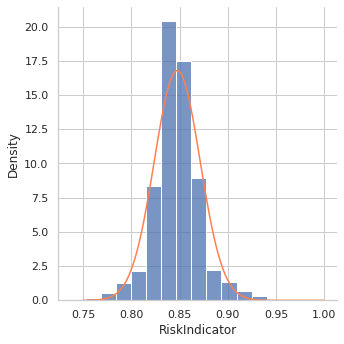

In [ ]:
import scipy.stats
sns.displot(data_resampled_denoised, x="RiskIndicator",bins = 15, stat="density")

mean = data_resampled_denoised.RiskIndicator.mean()
std = data_resampled_denoised.RiskIndicator.std()
x_min = 0.75
x_max = 1
x = np.linspace(x_min, x_max, 100)
y = scipy.stats.norm.pdf(x,mean,std)

plt.plot(x,y, color='coral')
plt.show()

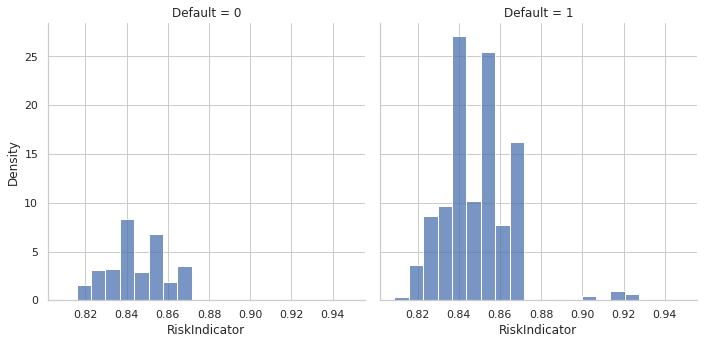

In [ ]:
sns.displot(data_train, x="RiskIndicator",col='Default' ,bins = 20, stat= 'density')

In [ ]:
data_resampled = Oversample_Minority(data = data_train)
h = len(data_train) - 2 * (data_train.Default == 0).sum()

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 4643, 1: 16356}
After oversampling
{0: 16356, 1: 16356}


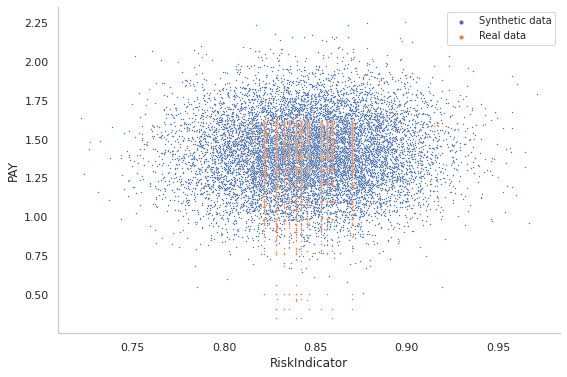

In [ ]:
sns.scatterplot(data=data_resampled.iloc[:h,:], x="RiskIndicator", y="PAY", s=2, label= 'Synthetic data')
sns.scatterplot(data=data_resampled.iloc[h + (data_train.Default == 1).sum():,:], x="RiskIndicator", y="PAY", s=2, label= 'Real data')
x_lim_min, x_lim_max, y_lim_min, y_lim_max = plt.axis()
sns.despine()
plt.grid(False)
plt.legend(prop={'size': 10}, markerscale= 3)
plt.show()

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_sample(data_train.loc[:,data_train.columns != 'Default'],data_train.loc[:,data_train.columns == 'Default'])
print("Before/After clean")
unique, counts = np.unique(data_train.loc[:,data_train.columns == 'Default'], return_counts=True)
print(dict(zip(unique, counts)))
unique, counts = np.unique(y_res, return_counts=True)
print(dict(zip(unique, counts)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Before/After clean
{0: 4643, 1: 16356}
{0: 16356, 1: 16356}


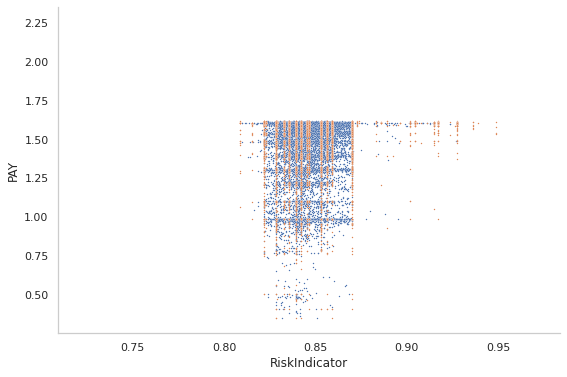

In [ ]:
sns.scatterplot(data=pd.DataFrame(X_res, columns = data_train.columns[:-1]).iloc[len(data_train):,:], x="RiskIndicator", y="PAY", s=2)
sns.scatterplot(data=data_train, x="RiskIndicator", y="PAY", s=2)
plt.xlim([x_lim_min, x_lim_max])
plt.ylim([y_lim_min, y_lim_max])
sns.despine()
plt.grid(False)
plt.show()

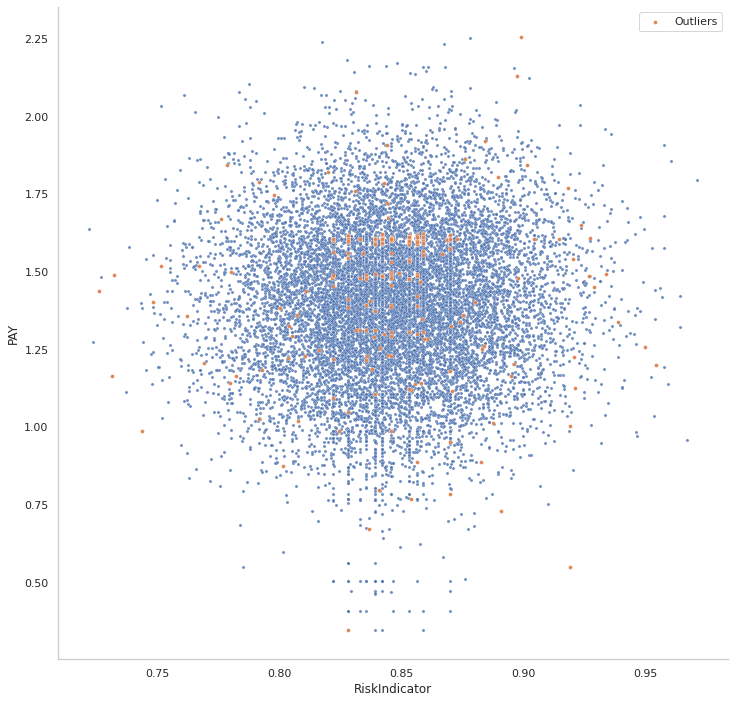

-----------------Denoising-----------------------
Zero Observations: 16356 Denoised: 246 Ratio: 1.504035216434336
Ones Observations: 16356 Denoised: 246 Ratio: 1.504035216434336


In [ ]:
A = Remove_Outliers(data_resampled, n_components=1, threshold= 0.985, plot= True )

## GMSVM

In [ ]:
from google.colab import files
data_train.to_csv('data_train.csv')
files.download('data_train.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
data_test.to_csv('data_test.csv')
files.download('data_test.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.model_selection import KFold
# prepare cross validation
kfold = KFold(5, True, 42)
par_C = []
par_gamma = []
par_threshold = []
par_acc_test = []
par_acc_val = []
par_auc_test = []
par_auc_val = []
components = []
# enumerate splits
for t in [0]: #0.985, 0.95, 0.97, 0.925, 0.90, 0.85]:
  for C in [0.01, 0.1, 1, 10, 100, 100]:
    for gamma in [0.01, 0.1, 1, 10, 100]:
      for n_c in range(1, 4):
        acc_test = []
        acc_validation = []
        roc_auc_test = []
        roc_auc_validation = []
        for train, test in kfold.split(data_train):
          df_train = data.iloc[train, :]
          df_test = data.iloc[test, :]
          data_train_resampled = Oversample_Minority(df_train, n_components_res= n_c)
          data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = t, n_components= n_c)
          data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

          X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
          y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
          X_validation = df_test.loc[:,data.columns != 'Default']
          y_validation = df_test.loc[:,data.columns == 'Default']
          X_test_clean = data_test.loc[:,data.columns != 'Default']
          y_test_clean = data_test.loc[:,data.columns == 'Default']

          sc = StandardScaler()
          X_train_clean_res = sc.fit_transform(X_train_clean_res)
          X_validation = sc.fit_transform(X_validation)
          X_test_clean = sc.transform(X_test_clean)

          gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = C, gamma = gamma).fit(X_train_clean_res, y_train_clean_res)
          y_pred_svc = gmsvm.decision_function(X_test_clean)
          y_pred_validation = gmsvm.decision_function(X_validation)
          fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
          roc_auc_test.append(auc(fpr, tpr))
          fpr, tpr, _ = roc_curve(y_validation, y_pred_validation)
          roc_auc_validation.append(auc(fpr, tpr))
          y_pred_test = gmsvm.predict(X_test_clean)
          y_pred_validation = gmsvm.predict(X_validation)
          acc_test.append(accuracy_score(y_test_clean, y_pred_test))
          acc_validation.append(accuracy_score(y_validation, y_pred_validation))


        acc_test = np.array(acc_test).mean()
        acc_validation = np.array(acc_validation).mean()
        roc_auc_test = np.array(roc_auc_test).mean()
        roc_auc_validation = np.array(roc_auc_validation).mean()
        par_C.append(C)
        par_gamma.append(gamma)
        par_threshold.append(t)
        par_acc_test.append(acc_test)
        par_acc_val.append(acc_validation)
        par_auc_test.append(roc_auc_test)
        par_auc_val.append(roc_auc_validation)
        components.append(n_c)


results = pd.DataFrame()
results['C'] = par_C
results['gamma'] = par_gamma
results['Threshold'] = par_threshold
results['Components'] = components
results['Validation Accuracy'] = par_acc_val
results['Validation AUC'] = par_auc_val
results['Test Accuracy'] = par_acc_test
results['Test AUC'] = par_auc_test

results = round(results.astype(float), 4)

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}


KeyboardInterrupt: ignored

In [ ]:
results.sort_values(by= 'Validation Accuracy', ascending = False)

NameError: ignored

In [ ]:
from sklearn.model_selection import KFold
# prepare cross validation
kfold = KFold(5, True, 42)
par_C = []
par_gamma = []
par_threshold = []
par_acc_test = []
par_acc_val = []
par_auc_test = []
par_auc_val = []
# enumerate splits
for t in [0.95]:#0.97, 0.925, 0.90, 0.85]:
  for C in [0.01, 0.1, 1, 10, 100, 100]:
    for gamma in [0.01, 0.1, 1, 10, 100]:
      acc_test = []
      acc_validation = []
      roc_auc_test = []
      roc_auc_validation = []
      for train, test in kfold.split(data_train):
        df_train = data.iloc[train, :]
        df_test = data.iloc[test, :]
        data_train_resampled = Oversample_Minority(df_train, n_components_res= 1)
        data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = t)
        data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

        X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
        y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
        X_validation = df_test.loc[:,data.columns != 'Default']
        y_validation = df_test.loc[:,data.columns == 'Default']
        X_test_clean = data_test.loc[:,data.columns != 'Default']
        y_test_clean = data_test.loc[:,data.columns == 'Default']

        sc = StandardScaler()
        X_train_clean_res = sc.fit_transform(X_train_clean_res)
        X_validation = sc.fit_transform(X_validation)
        X_test_clean = sc.transform(X_test_clean)

        gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = C, gamma = gamma).fit(X_train_clean_res, y_train_clean_res)
        y_pred_svc = gmsvm.decision_function(X_test_clean)
        y_pred_validation = gmsvm.decision_function(X_validation)
        fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
        roc_auc_test.append(auc(fpr, tpr))
        fpr, tpr, _ = roc_curve(y_validation, y_pred_validation)
        roc_auc_validation.append(auc(fpr, tpr))
        y_pred_test = gmsvm.predict(X_test_clean)
        y_pred_validation = gmsvm.predict(X_validation)
        acc_test.append(accuracy_score(y_test_clean, y_pred_test))
        acc_validation.append(accuracy_score(y_validation, y_pred_validation))


      acc_test = np.array(acc_test).mean()
      acc_validation = np.array(acc_validation).mean()
      roc_auc_test = np.array(roc_auc_test).mean()
      roc_auc_validation = np.array(roc_auc_validation).mean()
      par_C.append(C)
      par_gamma.append(gamma)
      par_threshold.append(t)
      par_acc_test.append(acc_test)
      par_acc_val.append(acc_validation)
      par_auc_test.append(roc_auc_test)
      par_auc_val.append(roc_auc_validation)


results = pd.DataFrame()
results['C'] = par_C
results['gamma'] = par_gamma
results['Threshold'] = par_threshold
results['Validation Accuracy'] = par_acc_val
results['Validation AUC'] = par_auc_val
results['Test Accuracy'] = par_acc_test
results['Test AUC'] = par_auc_test

results = round(results.astype(float), 4)

In [ ]:
results.sort_values(by= 'Validation Accuracy', ascending = False)

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']

sc = StandardScaler()
X_train_clean_res = sc.fit_transform(X_train_clean_res)
X_test_clean = sc.transform(X_test_clean)


gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = 0.01, gamma = 0.01).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = gmsvm.decision_function(X_test_clean)
y_pred_train = gmsvm.decision_function(X_train_clean_res)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
AUC_test = auc(fpr, tpr)
fpr, tpr, _ = roc_curve(y_train_clean_res, y_pred_train)
AUC_train = auc(fpr, tpr)
y_pred_test = gmsvm.predict(X_test_clean)
y_pred_train = gmsvm.predict(X_train_clean_res)
acc_test = accuracy_score(y_test_clean, y_pred_test)
acc_train = accuracy_score(y_train_clean_res, y_pred_train)

print('Train:   acuuracy=', acc_train, 'AUC=', AUC_train)
print('Test:   acuuracy=', acc_test, 'AUC=', AUC_test)


In [ ]:
print(classification_report(y_test_clean, y_pred_test))

## Benchmarks SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_sample(data_train.loc[:,data.columns != 'Default'],data_train.loc[:,data.columns == 'Default'])
print("Before/After clean")
unique, counts = np.unique(data_train.loc[:,data.columns == 'Default'], return_counts=True)
print(dict(zip(unique, counts)))
unique, counts = np.unique(y_res, return_counts=True)
print(dict(zip(unique, counts)))

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


NameError: ignored

LinearSVM acc: 0.5914649058449498


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression acc: 0.5920151626314503
              precision    recall  f1-score   support

           0       0.77      0.71      0.74     16356
           1       0.73      0.79      0.76     16356

    accuracy                           0.75     32712
   macro avg       0.75      0.75      0.75     32712
weighted avg       0.75      0.75      0.75     32712

GradientBoostingClassifier acc: 0.8510026901442895
BaggingClassifier acc: 0.990553925165077
RandomForestClassifier acc: 0.9996331621423331


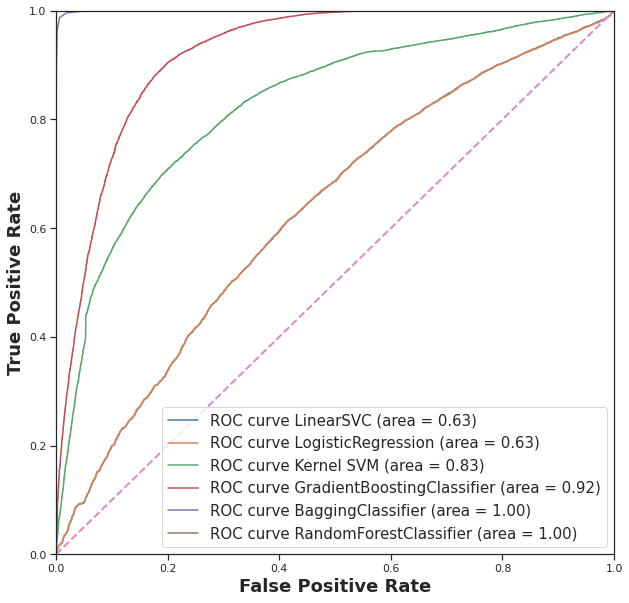

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

LinearSVM acc: 0.539
              precision    recall  f1-score   support

           0       0.28      0.70      0.40      1992
           1       0.85      0.49      0.63      7008

    accuracy                           0.54      9000
   macro avg       0.57      0.59      0.51      9000
weighted avg       0.72      0.54      0.58      9000



/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression acc: 0.5404444444444444
              precision    recall  f1-score   support

           0       0.28      0.69      0.40      1992
           1       0.85      0.50      0.63      7008

    accuracy                           0.54      9000
   macro avg       0.57      0.59      0.51      9000
weighted avg       0.72      0.54      0.58      9000

              precision    recall  f1-score   support

           0       0.45      0.63      0.53      1992
           1       0.88      0.78      0.83      7008

    accuracy                           0.75      9000
   macro avg       0.67      0.71      0.68      9000
weighted avg       0.79      0.75      0.76      9000

GradientBoostingClassifier acc: 0.7934444444444444
              precision    recall  f1-score   support

           0       0.53      0.53      0.53      1992
           1       0.87      0.87      0.87      7008

    accuracy                           0.79      9000
   macro avg       0.70      0.70 

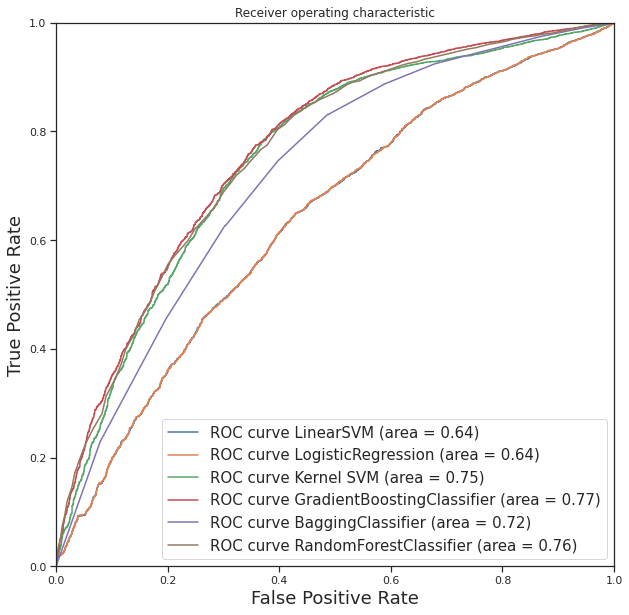

In [ ]:
# Test Set wiht SMOTE

X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])8
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

## GM-SMOTE + Benchmarks

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 4643, 1: 16356}
After oversampling
{0: 16356, 1: 16356}
-----------------Denoising-----------------------
Zero Observations: 16356 Denoised: 246 Ratio: 1.504035216434336
Ones Observations: 16356 Denoised: 246 Ratio: 1.504035216434336


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LinearSVM acc: 0.5472687771570454


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression acc: 0.5267225325884544


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           0       0.93      0.80      0.86     16110
           1       0.82      0.94      0.88     16110

    accuracy                           0.87     32220
   macro avg       0.87      0.87      0.87     32220
weighted avg       0.87      0.87      0.87     32220



/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GradientBoostingClassifier acc: 0.8781191806331471


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


BaggingClassifier acc: 0.9938237119801365


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:69: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestClassifier acc: 0.9996275605214152


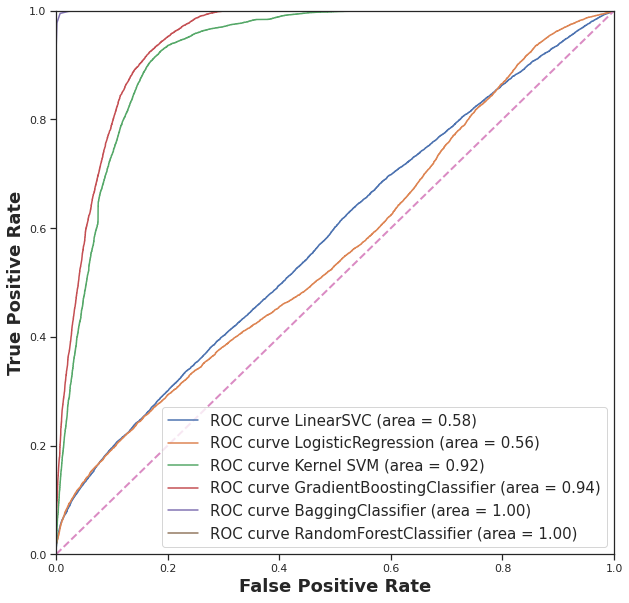

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LinearSVM acc: 0.5504444444444444


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression acc: 0.5256666666666666


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           0       0.59      0.33      0.43      1992
           1       0.83      0.94      0.88      7008

    accuracy                           0.80      9000
   macro avg       0.71      0.63      0.65      9000
weighted avg       0.78      0.80      0.78      9000



/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GradientBoostingClassifier acc: 0.805


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


BaggingClassifier acc: 0.7835555555555556


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:83: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestClassifier acc: 0.8054444444444444


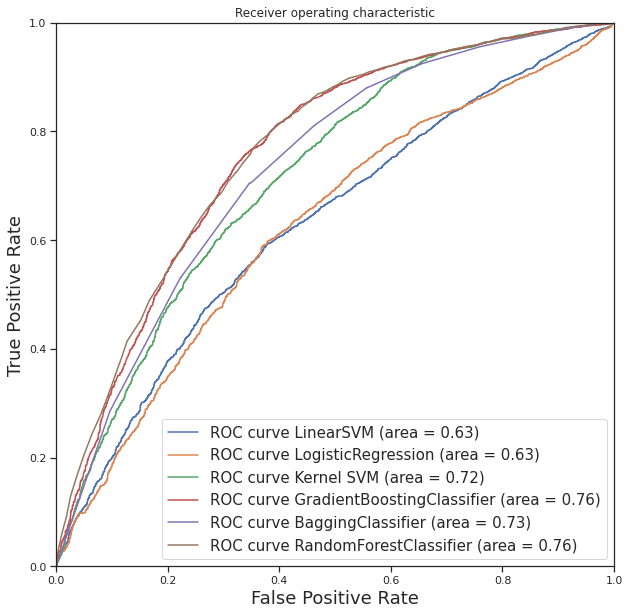

In [ ]:


X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))



logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))




sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))



bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))




randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))



#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.95)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']


In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

In [ ]:


X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))



logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))




sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))



bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))




randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))



#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

# Australia

## Data Cleaning + Categorical to Continuous

In [ ]:
filename = '/content/gdrive/My Drive/australian.xlsx'
data = pd.read_excel(filename)
print(data.shape)
print(data.columns)
data.head(10)

(690, 15)
Index(['A1', 'B1', 'B2', 'A2', 'A3', 'A4', 'B3', 'A5', 'A6', 'B4', 'A7', 'A8',
       'B5', 'B6', 'Default'],
      dtype='object')


,A1,B1,B2,A2,A3,A4,B3,A5,A6,B4,A7,A8,B5,B6,Default
0,1,22.08,11.460,2,4,4,1.585,0,0,0,1,2,100,1213,0
1,0,22.67,7.000,2,8,4,0.165,0,0,0,0,2,160,1,0
2,0,29.58,1.750,1,4,4,1.250,0,0,0,1,2,280,1,0
3,0,21.67,11.500,1,5,3,0.000,1,1,11,1,2,0,1,1
4,1,20.17,8.170,2,6,4,1.960,1,1,14,0,2,60,159,1
5,0,15.83,0.585,2,8,8,1.500,1,1,2,0,2,100,1,1
6,1,17.42,6.500,2,3,4,0.125,0,0,0,0,2,60,101,0
7,0,58.67,4.460,2,11,8,3.040,1,1,6,0,2,43,561,1
8,1,27.83,1.000,1,2,8,3.000,0,0,0,0,2,176,538,0
9,0,55.75,7.080,2,4,8,6.750,1,1,3,1,2,100,51,0


In [ ]:
data.isnull().sum()

A1         0
B1         0
B2         0
A2         0
A3         0
A4         0
B3         0
A5         0
A6         0
B4         0
A7         0
A8         0
B5         0
B6         0
Default    0
dtype: int64

In [ ]:
len(data.loc[data.Default == 0,:])

383

In [ ]:
len(data.loc[data.Default == 1,:])

307

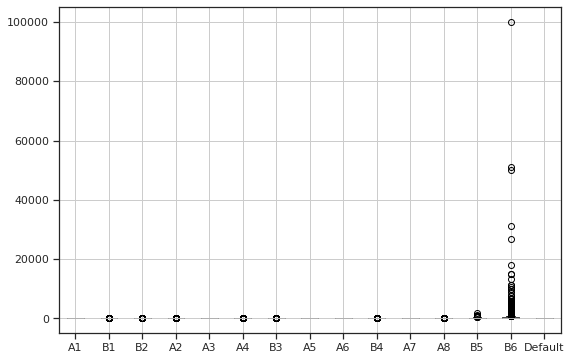

In [ ]:
data.boxplot()

In [ ]:
unique, counts = np.unique(data.Default, return_counts=True)
print(dict(zip(unique, counts)))

{0: 383, 1: 307}


In [ ]:
data['Default'] = data['Default'].replace([0,1],[1,0])

In [ ]:
from sklearn.model_selection import train_test_split
data_train, data_test = train_test_split(data, test_size=0.3, random_state=42)

In [ ]:
for i in data_train.A1.unique():
  r = (data_train.loc[data_train['A1'] == i].Default.sum())/(len(data_train.loc[data_train['A1'] == i].Default))
  data['A1'] = data['A1'].replace(i, r)
  print('A1 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A1'] == i].Default)))
  print('___________________________________')

A1 =  1
Paid in Full Rate = 0.5353846153846153
Observations 325
___________________________________
A1 =  0
Paid in Full Rate = 0.5253164556962026
Observations 158
___________________________________


In [ ]:
for i in data_train.A2.unique():
  r = (data_train.loc[data_train['A2'] == i].Default.sum())/(len(data_train.loc[data_train['A2'] == i].Default))
  data['A2'] = data['A2'].replace(i, r)
  print('A2 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A2'] == i].Default)))
  print('___________________________________')

A2 =  2
Paid in Full Rate = 0.4827586206896552
Observations 377
___________________________________
A2 =  1
Paid in Full Rate = 0.7142857142857143
Observations 105
___________________________________
A2 =  3
Paid in Full Rate = 0.0
Observations 1
___________________________________


In [ ]:
for i in data_train.A3.unique():
  r = (data_train.loc[data_train['A3'] == i].Default.sum())/(len(data_train.loc[data_train['A3'] == i].Default))
  data['A3'] = data['A3'].replace(i, r)
  print('A3 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A3'] == i].Default)))
  print('___________________________________')

A3 =  13
Paid in Full Rate = 0.2413793103448276
Observations 29
___________________________________
A3 =  8
Paid in Full Rate = 0.5392156862745098
Observations 102
___________________________________
A3 =  14
Paid in Full Rate = 0.1724137931034483
Observations 29
___________________________________
A3 =  6
Paid in Full Rate = 0.6153846153846154
Observations 39
___________________________________
A3 =  9
Paid in Full Rate = 0.46938775510204084
Observations 49
___________________________________
A3 =  1
Paid in Full Rate = 0.9210526315789473
Observations 38
___________________________________
A3 =  3
Paid in Full Rate = 0.725
Observations 40
___________________________________
A3 =  10
Paid in Full Rate = 0.4117647058823529
Observations 17
___________________________________
A3 =  4
Paid in Full Rate = 0.7272727272727273
Observations 33
___________________________________
A3 =  11
Paid in Full Rate = 0.30357142857142855
Observations 56
___________________________________
A3 =  5
Paid in 

In [ ]:
for i in data_train.A4.unique():
  r = (data_train.loc[data_train['A4'] == i].Default.sum())/(len(data_train.loc[data_train['A4'] == i].Default))
  data['A4'] = data['A4'].replace(i, r)
  print('A4 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A4'] == i].Default)))
  print('___________________________________')

A4 =  8
Paid in Full Rate = 0.34065934065934067
Observations 91
___________________________________
A4 =  4
Paid in Full Rate = 0.5374149659863946
Observations 294
___________________________________
A4 =  1
Paid in Full Rate = 0.9024390243902439
Observations 41
___________________________________
A4 =  5
Paid in Full Rate = 0.5405405405405406
Observations 37
___________________________________
A4 =  9
Paid in Full Rate = 0.4
Observations 5
___________________________________
A4 =  3
Paid in Full Rate = 0.625
Observations 8
___________________________________
A4 =  2
Paid in Full Rate = 0.5
Observations 2
___________________________________
A4 =  7
Paid in Full Rate = 0.6
Observations 5
___________________________________


In [ ]:
for i in data_train.A5.unique():
  r = (data_train.loc[data_train['A5'] == i].Default.sum())/(len(data_train.loc[data_train['A5'] == i].Default))
  data['A5'] = data['A5'].replace(i, r)

for i in data_train.A6.unique():
  r = (data_train.loc[data_train['A6'] == i].Default.sum())/(len(data_train.loc[data_train['A6'] == i].Default))
  data['A6'] = data['A6'].replace(i, r)

for i in data_train.A7.unique():
  r = (data_train.loc[data_train['A7'] == i].Default.sum())/(len(data_train.loc[data_train['A7'] == i].Default))
  data['A7'] = data['A7'].replace(i, r)

for i in data_train.A8.unique():
  r = (data_train.loc[data_train['A8'] == i].Default.sum())/(len(data_train.loc[data_train['A8'] == i].Default))
  data['A8'] = data['A8'].replace(i, r)


In [ ]:
data['B1'] = data['B1'] + 1
data['B2'] = data['B2'] + 1
data['B3'] = data['B3'] + 1
data['B4'] = data['B4'] + 1
data['B5'] = data['B5'] + 1
data['B6'] = data['B6'] + 1

In [ ]:
data['RiskIndicator'] = data['A1'] + data['A2'] + data['A3'] + data['A4']
data['A'] = data['A5'] + data['A6'] + data['A7'] + data['A8']

In [ ]:
data = data.loc[:,['B1', 'B2', 'B3', 'B4', 'B5',
       'B6', 'A', 'RiskIndicator', 'Default']]

In [ ]:
data.min()

B1               14.750000
B2                1.000000
B3                1.000000
B4                1.000000
B5                1.000000
B6                2.000000
A                 1.510415
RiskIndicator     1.521148
Default           0.000000
dtype: float64

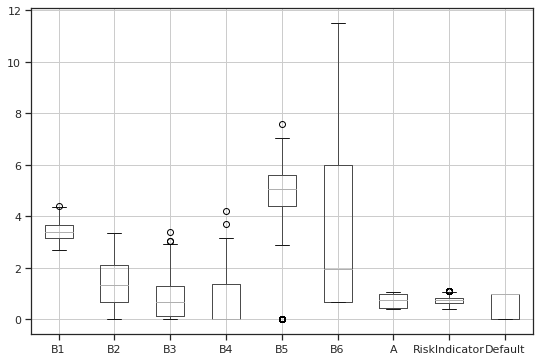

In [ ]:
for i in data.columns[:-1]:
  data.loc[:,i] = boxcox(data.loc[:,i],0)

data.boxplot()

In [ ]:
data_train, data_test = train_test_split(data, test_size=0.3, random_state=42)

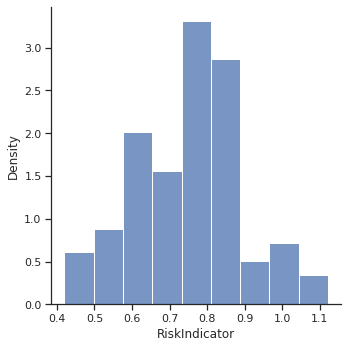

In [ ]:
sns.displot(data_train, x="RiskIndicator", bins = 9, stat="density")

## GMSVM

In [ ]:
from sklearn.model_selection import KFold
# prepare cross validation
kfold = KFold(5, True, 42)
par_C = []
par_gamma = []
par_threshold = []
par_acc_test = []
par_acc_val = []
par_auc_test = []
par_auc_val = []
components = []
# enumerate splits
for t in [0.985, 0.95, 0.97, 0.925, 0.90, 0.85]:
  for C in [0.01, 0.1, 1, 10, 100, 100]:
    for gamma in [0.01, 0.1, 1, 10, 100]:
      for n_c in range(1, 10):
        acc_test = []
        acc_validation = []
        roc_auc_test = []
        roc_auc_validation = []
        for train, test in kfold.split(data_train):
          df_train = data.iloc[train, :]
          df_test = data.iloc[test, :]
          data_train_resampled = Oversample_Minority(df_train, n_components_res= n_c)
          data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = t, n_components= n_c)
          data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

          X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
          y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
          X_validation = df_test.loc[:,data.columns != 'Default']
          y_validation = df_test.loc[:,data.columns == 'Default']
          X_test_clean = data_test.loc[:,data.columns != 'Default']
          y_test_clean = data_test.loc[:,data.columns == 'Default']

          sc = StandardScaler()
          X_train_clean_res = sc.fit_transform(X_train_clean_res)
          X_validation = sc.fit_transform(X_validation)
          X_test_clean = sc.transform(X_test_clean)

          gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = C, gamma = gamma).fit(X_train_clean_res, y_train_clean_res)
          y_pred_svc = gmsvm.decision_function(X_test_clean)
          y_pred_validation = gmsvm.decision_function(X_validation)
          fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
          roc_auc_test.append(auc(fpr, tpr))
          fpr, tpr, _ = roc_curve(y_validation, y_pred_validation)
          roc_auc_validation.append(auc(fpr, tpr))
          y_pred_test = gmsvm.predict(X_test_clean)
          y_pred_validation = gmsvm.predict(X_validation)
          acc_test.append(accuracy_score(y_test_clean, y_pred_test))
          acc_validation.append(accuracy_score(y_validation, y_pred_validation))


        acc_test = np.array(acc_test).mean()
        acc_validation = np.array(acc_validation).mean()
        roc_auc_test = np.array(roc_auc_test).mean()
        roc_auc_validation = np.array(roc_auc_validation).mean()
        par_C.append(C)
        par_gamma.append(gamma)
        par_threshold.append(t)
        par_acc_test.append(acc_test)
        par_acc_val.append(acc_validation)
        par_auc_test.append(roc_auc_test)
        par_auc_val.append(roc_auc_validation)
        components.append(n_c)


results = pd.DataFrame()
results['C'] = par_C
results['gamma'] = par_gamma
results['Threshold'] = par_threshold
results['Components'] = components
results['Validation Accuracy'] = par_acc_val
results['Validation AUC'] = par_auc_val
results['Test Accuracy'] = par_acc_test
results['Test AUC'] = par_auc_test

results = round(results.astype(float), 4)

34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 4 Ratio: 1.9047619047619049
Ones Observations: 210 Denoised: 4 Ratio: 1.9047619047619049


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 4 Ratio: 1.8433179723502304
Ones Observations: 217 Denoised: 4 Ratio: 1.8433179723502304


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 4 Ratio: 1.8691588785046727
Ones Observations: 214 Denoised: 4 Ratio: 1.8691588785046727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observa

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Obser

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Compo

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Compo

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 11 Ratio: 5.238095238095238
Ones Observations: 210 Denoised: 11 Ratio: 5.238095238095238


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 11 Ratio: 5.0691244239631335
Ones Observations: 217 Denoised: 11 Ratio: 5.0691244239631335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 11 Ratio: 5.14018691588785
Ones Observations: 214 Denoised: 11 Ratio: 5.14018691588785


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observa

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Obs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observa

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Compone

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 7 Ratio: 3.3333333333333335
Ones Observations: 210 Denoised: 7 Ratio: 3.3333333333333335


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 7 Ratio: 3.225806451612903
Ones Observations: 217 Denoised: 7 Ratio: 3.225806451612903


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 7 Ratio: 3.2710280373831773
Ones Observations: 214 Denoised: 7 Ratio: 3.2710280373831773


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
Ones Observations: 210 Denoised: 16 Ratio: 7.6190476190476195
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 17 Ratio: 7.834101382488479
Ones Observations: 217 Denoised: 17 Ratio: 7.834101382488479


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 16 Ratio: 7.476635514018691
Ones Observations: 214 Denoised: 16 Ratio: 7.476635514018691
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Compo

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ra

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 21 Ratio: 10.0
Ones Observations: 210 Denoised: 21 Ratio: 10.0
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 22 Ratio: 10.138248847926267
Ones Observations: 217 Denoised: 22 Ratio: 10.138248847926267
41
------------- Over Sampling -------------
Number of Components: 9

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 22 Ratio: 10.2803738317757
Ones Observations: 214 Denoised: 22 Ratio: 10.2803738317757
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observat

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 5

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
34
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381
41

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


40
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


48
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}
-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


34
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 176, 1: 210}
After oversampling
{0: 210, 1: 210}
-----------------Denoising-----------------------
Zero Observations: 210 Denoised: 32 Ratio: 15.238095238095239
Ones Observations: 210 Denoised: 32 Ratio: 15.238095238095239
40
------------- Over Sampling -------------
Number of Components: 9


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 173, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
48
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 169, 1: 217}
After oversampling
{0: 217, 1: 217}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 217 Denoised: 33 Ratio: 15.207373271889402
Ones Observations: 217 Denoised: 33 Ratio: 15.207373271889402
41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


41
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 173, 1: 214}
After oversampling
{0: 214, 1: 214}
-----------------Denoising-----------------------
Zero Observations: 214 Denoised: 32 Ratio: 14.953271028037381
Ones Observations: 214 Denoised: 32 Ratio: 14.953271028037381


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


In [ ]:
results.sort_values(by= 'Validation Accuracy', ascending = False)

,C,gamma,Threshold,Components,Validation Accuracy,Validation AUC,Test Accuracy,Test AUC
228,100.00,0.01,0.985,4.0,0.8715,0.9199,0.8957,0.9337
183,100.00,0.01,0.985,4.0,0.8715,0.9199,0.8957,0.9337
375,1.00,0.10,0.950,7.0,0.8694,0.9196,0.8821,0.9303
139,10.00,0.01,0.985,5.0,0.8694,0.9224,0.8860,0.9292
142,10.00,0.01,0.985,8.0,0.8694,0.9240,0.8860,0.9300
...,...,...,...,...,...,...,...,...
626,0.10,100.00,0.970,6.0,0.5010,0.6107,0.5623,0.9083
850,0.01,100.00,0.925,5.0,0.5010,0.6035,0.5556,0.8929
627,0.10,100.00,0.970,7.0,0.5010,0.6001,0.5643,0.9053
628,0.10,100.00,0.970,8.0,0.5010,0.5937,0.5585,0.9083


In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']

sc = StandardScaler()
X_train_clean_res = sc.fit_transform(X_train_clean_res)
X_test_clean = sc.transform(X_test_clean)


gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = 10, gamma = 0.01).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = gmsvm.decision_function(X_test_clean)
y_pred_train = gmsvm.decision_function(X_train_clean_res)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
AUC_test = auc(fpr, tpr)
fpr, tpr, _ = roc_curve(y_train_clean_res, y_pred_train)
AUC_train = auc(fpr, tpr)
y_pred_test = gmsvm.predict(X_test_clean)
y_pred_train = gmsvm.predict(X_train_clean_res)
acc_test = accuracy_score(y_test_clean, y_pred_test)
acc_train = accuracy_score(y_train_clean_res, y_pred_train)

print('Train:   acuuracy=', acc_train, 'AUC=', AUC_train)
print('Test:   acuuracy=', acc_test, 'AUC=', AUC_test)
print(classification_report(y_test_clean, y_pred_test))

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 226, 1: 257}
After oversampling
{0: 257, 1: 257}
-----------------Denoising-----------------------
Zero Observations: 257 Denoised: 4 Ratio: 1.556420233463035
Ones Observations: 257 Denoised: 4 Ratio: 1.556420233463035
Train:   acuuracy= 0.8913043478260869 AUC= 0.9531003452639473
Test:   acuuracy= 0.9033816425120773 AUC= 0.9214187732706252
              precision    recall  f1-score   support

           0       0.89      0.86      0.87        81
           1       0.91      0.93      0.92       126

    accuracy                           0.90       207
   macro avg       0.90      0.90      0.90       207
weighted avg       0.90      0.90      0.90       207



/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## Benchmarks SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_sample(data_train.loc[:,data.columns != 'Default'],data_train.loc[:,data.columns == 'Default'])
print("Before/After clean")
unique, counts = np.unique(data_train.loc[:,data.columns == 'Default'], return_counts=True)
print(dict(zip(unique, counts)))
unique, counts = np.unique(y_res, return_counts=True)
print(dict(zip(unique, counts)))

Before/After clean
{0: 226, 1: 257}
{0: 257, 1: 257}


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


LinearSVM acc: 0.8715953307392996
LogisticRegression acc: 0.8599221789883269
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       257
           1       0.90      0.91      0.90       257

    accuracy                           0.90       514
   macro avg       0.90      0.90      0.90       514
weighted avg       0.90      0.90      0.90       514

GradientBoostingClassifier acc: 0.980544747081712
BaggingClassifier acc: 0.9844357976653697
RandomForestClassifier acc: 1.0


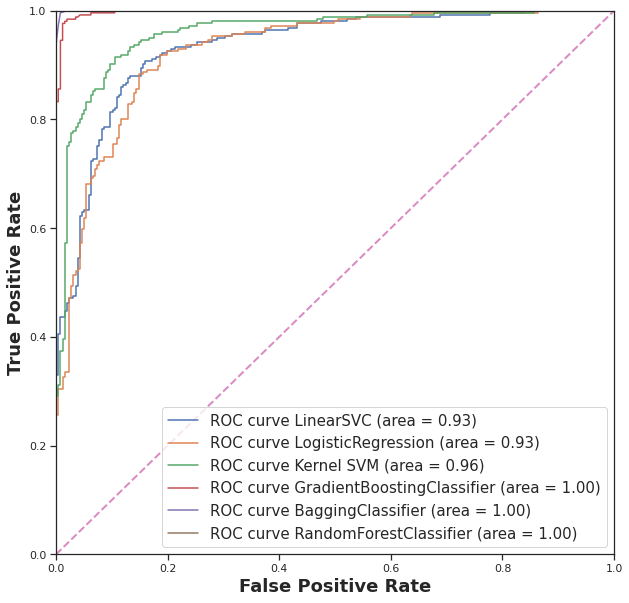

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

LinearSVM acc: 0.893719806763285
              precision    recall  f1-score   support

           0       0.86      0.86      0.86        81
           1       0.91      0.91      0.91       126

    accuracy                           0.89       207
   macro avg       0.89      0.89      0.89       207
weighted avg       0.89      0.89      0.89       207

LogisticRegression acc: 0.8792270531400966
              precision    recall  f1-score   support

           0       0.86      0.83      0.84        81
           1       0.89      0.91      0.90       126

    accuracy                           0.88       207
   macro avg       0.88      0.87      0.87       207
weighted avg       0.88      0.88      0.88       207

              precision    recall  f1-score   support

           0       0.85      0.84      0.84        81
           1       0.90      0.90      0.90       126

    accuracy                           0.88       207
   macro avg       0.87      0.87      0.87       20

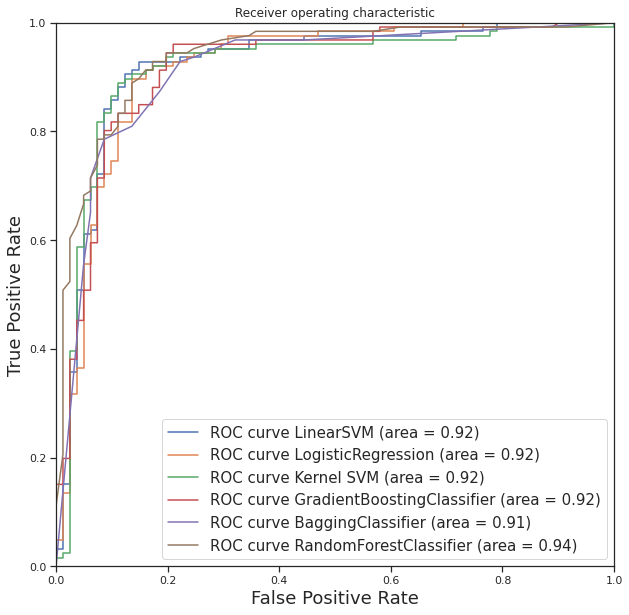

In [ ]:
# Test Set wiht SMOTE

X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

## GM-SMOTE + Benchmarks

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 226, 1: 257}
After oversampling
{0: 257, 1: 257}
-----------------Denoising-----------------------
Zero Observations: 257 Denoised: 4 Ratio: 1.556420233463035
Ones Observations: 257 Denoised: 4 Ratio: 1.556420233463035


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

LinearSVM acc: 0.8814229249011858
LogisticRegression acc: 0.8656126482213439
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       253
           1       0.90      0.92      0.91       253

    accuracy                           0.91       506
   macro avg       0.91      0.91      0.91       506
weighted avg       0.91      0.91      0.91       506

GradientBoostingClassifier acc: 0.9841897233201581


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:69: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


BaggingClassifier acc: 0.9861660079051383
RandomForestClassifier acc: 1.0


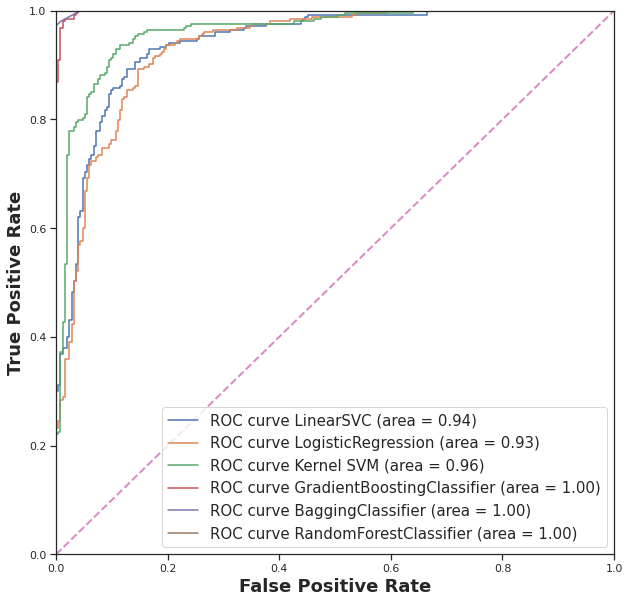

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

LinearSVM acc: 0.893719806763285
LogisticRegression acc: 0.855072463768116
              precision    recall  f1-score   support

           0       0.86      0.81      0.84        81
           1       0.88      0.91      0.90       126

    accuracy                           0.87       207
   macro avg       0.87      0.86      0.87       207
weighted avg       0.87      0.87      0.87       207

GradientBoostingClassifier acc: 0.855072463768116
BaggingClassifier acc: 0.8164251207729468
RandomForestClassifier acc: 0.8743961352657005


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:83: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


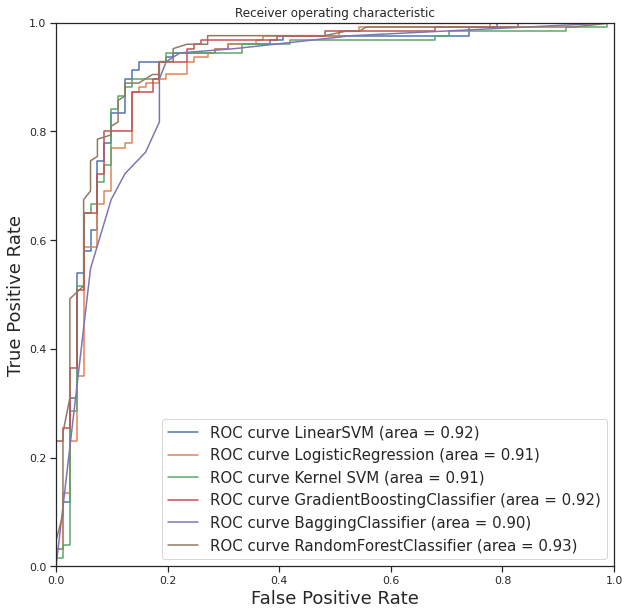

In [ ]:


X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))



logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))




sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))



bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))




randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))



#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.95)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 226, 1: 257}
After oversampling
{0: 257, 1: 257}
-----------------Denoising-----------------------
Zero Observations: 257 Denoised: 13 Ratio: 5.058365758754864
Ones Observations: 257 Denoised: 13 Ratio: 5.058365758754864


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

LinearSVM acc: 0.8872950819672131
LogisticRegression acc: 0.8770491803278688
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       244
           1       0.91      0.94      0.92       244

    accuracy                           0.92       488
   macro avg       0.92      0.92      0.92       488
weighted avg       0.92      0.92      0.92       488

GradientBoostingClassifier acc: 0.985655737704918


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:69: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


BaggingClassifier acc: 0.9979508196721312
RandomForestClassifier acc: 1.0


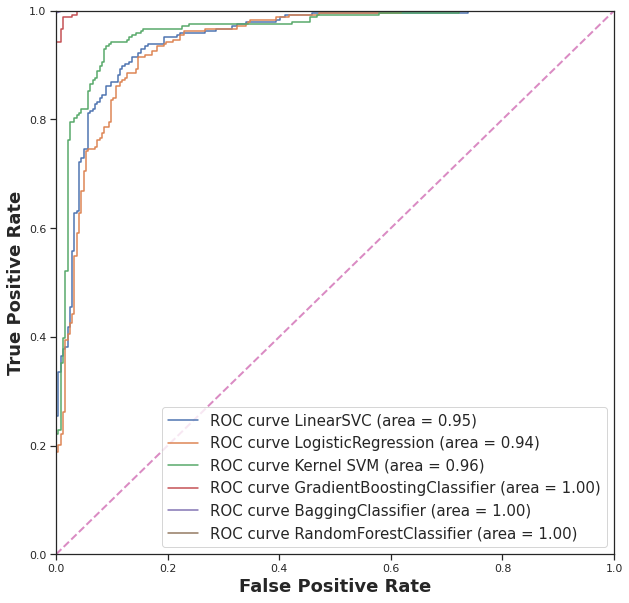

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

LinearSVM acc: 0.8985507246376812
LogisticRegression acc: 0.8695652173913043
              precision    recall  f1-score   support

           0       0.85      0.81      0.83        81
           1       0.88      0.90      0.89       126

    accuracy                           0.87       207
   macro avg       0.86      0.86      0.86       207
weighted avg       0.87      0.87      0.87       207

GradientBoostingClassifier acc: 0.8599033816425121
BaggingClassifier acc: 0.8454106280193237
RandomForestClassifier acc: 0.8695652173913043


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:83: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


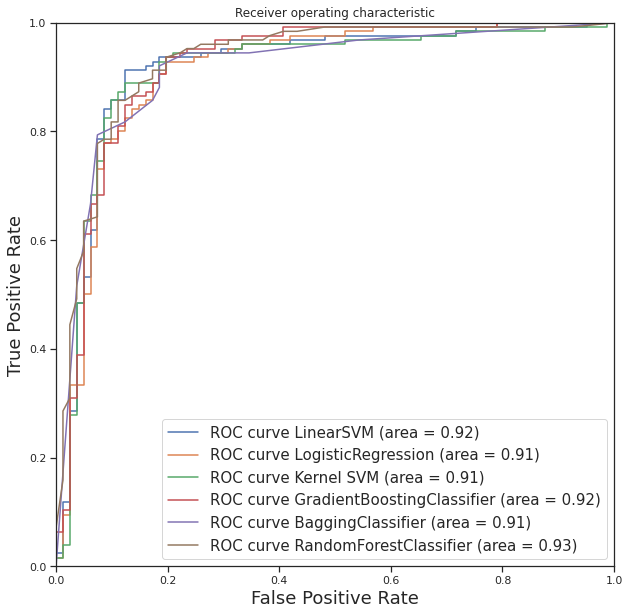

In [ ]:


X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))



logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))




sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))



bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))




randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))



#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

# Japanese Credit Screening

## Data Cleaning + Categorical to Continuous

In [ ]:
filename = '/content/gdrive/My Drive/Japanese.xlsx'
data = pd.read_excel(filename)
print(data.shape)
print(data.columns)
data.head(10)

(690, 16)
Index(['A1', 'B1', 'B2', 'A2', 'A3', 'A4', 'A5', 'B3', 'A6', 'A7', 'B4', 'A8',
       'A9', 'B5', 'B6', 'Default'],
      dtype='object')


,A1,B1,B2,A2,A3,A4,A5,B3,A6,A7,B4,A8,A9,B5,B6,Default
0,b,30.83,0.000,u,g,w,v,1.250,t,t,1,f,g,202,0,+
1,a,58.67,4.460,u,g,q,h,3.040,t,t,6,f,g,43,560,+
2,a,24.5,0.500,u,g,q,h,1.500,t,f,0,f,g,280,824,+
3,b,27.83,1.540,u,g,w,v,3.750,t,t,5,t,g,100,3,+
4,b,20.17,5.625,u,g,w,v,1.710,t,f,0,f,s,120,0,+
5,b,32.08,4.000,u,g,m,v,2.500,t,f,0,t,g,360,0,+
6,b,33.17,1.040,u,g,r,h,6.500,t,f,0,t,g,164,31285,+
7,a,22.92,11.585,u,g,cc,v,0.040,t,f,0,f,g,80,1349,+
8,b,54.42,0.500,y,p,k,h,3.960,t,f,0,f,g,180,314,+
9,b,42.5,4.915,y,p,w,v,3.165,t,f,0,t,g,52,1442,+


In [ ]:
data.isnull().sum()

A1         0
B1         0
B2         0
A2         0
A3         0
A4         0
A5         0
B3         0
A6         0
A7         0
B4         0
A8         0
A9         0
B5         0
B6         0
Default    0
dtype: int64

In [ ]:
data['Default'] = data['Default'].replace(['+','-'],[0,1])

In [ ]:
len(data.loc[data.Default == 0,:])

307

In [ ]:
data = data.replace('?', np.nan)

In [ ]:
data = data.dropna()

In [ ]:
unique, counts = np.unique(data.Default, return_counts=True)
print(dict(zip(unique, counts)))

{0: 296, 1: 357}


In [ ]:
from sklearn.model_selection import train_test_split
data_train, data_test = train_test_split(data, test_size=0.2, random_state=42)

In [ ]:
for i in data_train.A1.unique():
  r = (data_train.loc[data_train['A1'] == i].Default.sum())/(len(data_train.loc[data_train['A1'] == i].Default))
  data['A1'] = data['A1'].replace(i, r)
  print('A1 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A1'] == i].Default)))
  print('___________________________________')

A1 =  b
Paid in Full Rate = 0.5441988950276243
Observations 362
___________________________________
A1 =  a
Paid in Full Rate = 0.525
Observations 160
___________________________________


In [ ]:
for i in data_train.A2.unique():
  r = (data_train.loc[data_train['A2'] == i].Default.sum())/(len(data_train.loc[data_train['A2'] == i].Default))
  data['A2'] = data['A2'].replace(i, r)
  print('A2 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A2'] == i].Default)))
  print('___________________________________')

A2 =  u
Paid in Full Rate = 0.49122807017543857
Observations 399
___________________________________
A2 =  y
Paid in Full Rate = 0.6967213114754098
Observations 122
___________________________________
A2 =  l
Paid in Full Rate = 0.0
Observations 1
___________________________________


In [ ]:
for i in data_train.A3.unique():
  r = (data_train.loc[data_train['A3'] == i].Default.sum())/(len(data_train.loc[data_train['A3'] == i].Default))
  data['A3'] = data['A3'].replace(i, r)
  print('A3 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A3'] == i].Default)))
  print('___________________________________')

A3 =  g
Paid in Full Rate = 0.49122807017543857
Observations 399
___________________________________
A3 =  p
Paid in Full Rate = 0.6967213114754098
Observations 122
___________________________________
A3 =  gg
Paid in Full Rate = 0.0
Observations 1
___________________________________


In [ ]:
for i in data_train.A4.unique():
  r = (data_train.loc[data_train['A4'] == i].Default.sum())/(len(data_train.loc[data_train['A4'] == i].Default))
  data['A4'] = data['A4'].replace(i, r)
  print('A4 = ', i)
  print('Paid in Full Rate =', r)
  print('Observations', (len(data_train.loc[data_train['A4'] == i].Default)))
  print('___________________________________')

A4 =  d
Paid in Full Rate = 0.75
Observations 24
___________________________________
A4 =  c
Paid in Full Rate = 0.5188679245283019
Observations 106
___________________________________
A4 =  w
Paid in Full Rate = 0.45652173913043476
Observations 46
___________________________________
A4 =  ff
Paid in Full Rate = 0.9024390243902439
Observations 41
___________________________________
A4 =  e
Paid in Full Rate = 0.3333333333333333
Observations 21
___________________________________
A4 =  aa
Paid in Full Rate = 0.6756756756756757
Observations 37
___________________________________
A4 =  j
Paid in Full Rate = 0.6666666666666666
Observations 9
___________________________________
A4 =  i
Paid in Full Rate = 0.7659574468085106
Observations 47
___________________________________
A4 =  cc
Paid in Full Rate = 0.2727272727272727
Observations 33
___________________________________
A4 =  k
Paid in Full Rate = 0.6842105263157895
Observations 38
___________________________________
A4 =  q
Paid in Full

In [ ]:
for i in data_train.A5.unique():
  r = (data_train.loc[data_train['A5'] == i].Default.sum())/(len(data_train.loc[data_train['A5'] == i].Default))
  data['A5'] = data['A5'].replace(i, r)

for i in data_train.A6.unique():
  r = (data_train.loc[data_train['A6'] == i].Default.sum())/(len(data_train.loc[data_train['A6'] == i].Default))
  data['A6'] = data['A6'].replace(i, r)

for i in data_train.A7.unique():
  r = (data_train.loc[data_train['A7'] == i].Default.sum())/(len(data_train.loc[data_train['A7'] == i].Default))
  data['A7'] = data['A7'].replace(i, r)

for i in data_train.A8.unique():
  r = (data_train.loc[data_train['A8'] == i].Default.sum())/(len(data_train.loc[data_train['A8'] == i].Default))
  data['A8'] = data['A8'].replace(i, r)

for i in data_train.A9.unique():
  r = (data_train.loc[data_train['A9'] == i].Default.sum())/(len(data_train.loc[data_train['A9'] == i].Default))
  data['A9'] = data['A9'].replace(i, r)


In [ ]:
data.min()

A1          0.525000
B1         13.750000
B2          0.000000
A2          0.000000
A3          0.000000
A4          0.000000
A5          0.250000
B3          0.000000
A6          0.191489
A7          0.264069
B4          0.000000
A8          0.508547
A9          0.522917
B5          0.000000
B6          0.000000
Default     0.000000
dtype: float64

In [ ]:
data['B2'] = data['B2'] + 1
data['B3'] = data['B3'] + 1
data['B4'] = data['B4'] + 1
data['B5'] = data['B5'] + 1
data['B6'] = data['B6'] + 1

In [ ]:
data['RiskIndicator'] = data['A1'] + data['A2'] + data['A3'] + data['A4']
data['A'] = data['A5'] + data['A6'] + data['A7'] + data['A8'] + data['A9']

In [ ]:
data['A8']

0      0.562500
1      0.562500
2      0.562500
3      0.508547
4      0.562500
         ...   
685    0.562500
686    0.508547
687    0.508547
688    0.562500
689    0.508547
Name: A8, Length: 653, dtype: float64

In [ ]:
data = data.loc[:,['B1', 'B2', 'B3', 'B4', 'B5',
       'B6', 'A', 'RiskIndicator', 'Default']]

In [ ]:
data.min()

B1               13.750000
B2                1.000000
B3                1.000000
B4                1.000000
B5                1.000000
B6                1.000000
A                 1.737022
RiskIndicator     0.797727
Default           0.000000
dtype: float64

In [ ]:
#for i in data.columns[:-1]:
#  data.loc[:,i] = boxcox(data.loc[:,i],0)

#data.boxplot()

In [ ]:
data_train, data_test = train_test_split(data, test_size=0.2, random_state=42)

In [ ]:
data_test

,B1,B2,B3,B4,B5,B6,A,RiskIndicator,Default
114,20.67,2.250,2.375,4,141.0,211,1.842162,2.456509,1
287,29.50,1.580,1.290,2,341.0,2804,2.855319,1.983177,1
205,35.42,13.000,15.000,9,1.0,6591,1.896115,1.846166,0
449,20.00,8.000,1.500,1,1.0,1,3.347264,2.045523,1
470,21.92,12.665,1.085,1,321.0,6,3.142404,2.191667,1
...,...,...,...,...,...,...,...,...,...
227,22.50,9.460,3.460,1,165.0,1,3.347264,2.085109,0
439,25.92,1.875,1.375,3,175.0,4,2.801366,2.210866,1
399,31.00,3.085,1.085,1,301.0,1,3.347264,2.045523,1
543,36.33,4.790,2.165,1,201.0,1,2.538967,1.983177,1


## GMSVM

In [ ]:
from sklearn.model_selection import KFold
# prepare cross validation
kfold = KFold(5, True, 42)
par_C = []
par_gamma = []
par_threshold = []
par_acc_test = []
par_acc_val = []
par_auc_test = []
par_auc_val = []
components = []
# enumerate splits
for t in [0.985, 0.95, 0.97, 0.925, 0.90, 0.85]:
  for C in [0.01, 0.1, 1, 10, 100, 100]:
    for gamma in [0.01, 0.1, 1, 10, 100]:
      for n_c in range(1, 10):
        acc_test = []
        acc_validation = []
        roc_auc_test = []
        roc_auc_validation = []
        for train, test in kfold.split(data_train):
          df_train = data.iloc[train, :]
          df_test = data.iloc[test, :]
          data_train_resampled = Oversample_Minority(df_train, n_components_res= n_c)
          data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = t, n_components= n_c)
          data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

          X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
          y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
          X_validation = df_test.loc[:,data.columns != 'Default']
          y_validation = df_test.loc[:,data.columns == 'Default']
          X_test_clean = data_test.loc[:,data.columns != 'Default']
          y_test_clean = data_test.loc[:,data.columns == 'Default']

          sc = StandardScaler()
          X_train_clean_res = sc.fit_transform(X_train_clean_res)
          X_validation = sc.fit_transform(X_validation)
          X_test_clean = sc.transform(X_test_clean)

          gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = C, gamma = gamma).fit(X_train_clean_res, y_train_clean_res)
          y_pred_svc = gmsvm.decision_function(X_test_clean)
          y_pred_validation = gmsvm.decision_function(X_validation)
          fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
          roc_auc_test.append(auc(fpr, tpr))
          fpr, tpr, _ = roc_curve(y_validation, y_pred_validation)
          roc_auc_validation.append(auc(fpr, tpr))
          y_pred_test = gmsvm.predict(X_test_clean)
          y_pred_validation = gmsvm.predict(X_validation)
          acc_test.append(accuracy_score(y_test_clean, y_pred_test))
          acc_validation.append(accuracy_score(y_validation, y_pred_validation))


        acc_test = np.array(acc_test).mean()
        acc_validation = np.array(acc_validation).mean()
        roc_auc_test = np.array(roc_auc_test).mean()
        roc_auc_validation = np.array(roc_auc_validation).mean()
        par_C.append(C)
        par_gamma.append(gamma)
        par_threshold.append(t)
        par_acc_test.append(acc_test)
        par_acc_val.append(acc_validation)
        par_auc_test.append(roc_auc_test)
        par_auc_val.append(roc_auc_validation)
        components.append(n_c)


results = pd.DataFrame()
results['C'] = par_C
results['gamma'] = par_gamma
results['Threshold'] = par_threshold
results['Components'] = components
results['Validation Accuracy'] = par_acc_val
results['Validation AUC'] = par_auc_val
results['Test Accuracy'] = par_acc_test
results['Test AUC'] = par_auc_test

results = round(results.astype(float), 4)

15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observ

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observ

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observ

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Com

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observ

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
Ones Observations: 216 Denoised: 4 Ratio: 1.8518518518518516
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 4 Ratio: 1.762114537444934
Ones Observations: 227 Denoised: 4 Ratio: 1.762114537444934
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
Ones Observations: 213 Denoised: 4 Ratio: 1.8779342723004695
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
Ones Observations: 228 Denoised: 4 Ratio: 1.7543859649122806
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
1

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 R

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversamplin

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 11 Ratio: 5.092592592592593
Ones Observations: 216 Denoised: 11 Ratio: 5.092592592592593
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 12 Ratio: 5.286343612334802
Ones Observations: 227 Denoised: 12 Ratio: 5.286343612334802
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 11 Ratio: 5.164319248826291
Ones Observations: 213 Denoised: 11 Ratio: 5.164319248826291
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 12 Ratio: 5.263157894736842
Ones Observations: 228 Denoised: 12 Ratio: 5.263157894736842
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Componen

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising--------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Compo

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Componen

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Componen

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Obser

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
Ones Observations: 216 Denoised: 7 Ratio: 3.2407407407407405
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
Ones Observations: 227 Denoised: 7 Ratio: 3.0837004405286343
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 7 Ratio: 3.286384976525822
Ones Observations: 213 Denoised: 7 Ratio: 3.286384976525822


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 7 Ratio: 3.070175438596491
Ones Observations: 228 Denoised: 7 Ratio: 3.070175438596491
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
Ones Observations: 220 Denoised: 7 Ratio: 3.1818181818181817
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Obse

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Comp

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Compon

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 17 Ratio: 7.87037037037037
Ones Observations: 216 Denoised: 17 Ratio: 7.87037037037037
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 17 Ratio: 7.488986784140969
Ones Observations: 227 Denoised: 17 Ratio: 7.488986784140969
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 16 Ratio: 7.511737089201878
Ones Observations: 213 Denoised: 16 Ratio: 7.511737089201878


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 18 Ratio: 7.894736842105263
Ones Observations: 228 Denoised: 18 Ratio: 7.894736842105263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 17 Ratio: 7.727272727272727
Ones Observations: 220 Denoised: 17 Ratio: 7.727272727272727
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversam

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversam

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before overs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversam

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 22 Ratio: 10.185185185185185
Ones Observations: 216 Denoised: 22 Ratio: 10.185185185185185


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 23 Ratio: 10.13215859030837
Ones Observations: 227 Denoised: 23 Ratio: 10.13215859030837
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 22 Ratio: 10.328638497652582
Ones Observations: 213 Denoised: 22 Ratio: 10.328638497652582


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 23 Ratio: 10.087719298245613
Ones Observations: 228 Denoised: 23 Ratio: 10.087719298245613


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 22 Ratio: 10.0
Ones Observations: 220 Denoised: 22 Ratio: 10.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before overs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio:

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before overs

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of C

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 9

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zer

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."



------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 2
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 3
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


15
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 4
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 5
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 6
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}
-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


8
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}
-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779
37
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756
38
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457
22
------------- Over Sampling -------------
Number of Components: 8
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0
15
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 201, 1: 216}
After oversampling
{0: 216, 1: 216}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 216 Denoised: 33 Ratio: 15.277777777777779
Ones Observations: 216 Denoised: 33 Ratio: 15.277777777777779


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


37
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 227}
After oversampling
{0: 227, 1: 227}
-----------------Denoising-----------------------
Zero Observations: 227 Denoised: 34 Ratio: 14.977973568281937
Ones Observations: 227 Denoised: 34 Ratio: 14.977973568281937
8
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 205, 1: 213}
After oversampling
{0: 213, 1: 213}


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


-----------------Denoising-----------------------
Zero Observations: 213 Denoised: 32 Ratio: 15.023474178403756
Ones Observations: 213 Denoised: 32 Ratio: 15.023474178403756


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


38
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 190, 1: 228}
After oversampling
{0: 228, 1: 228}
-----------------Denoising-----------------------
Zero Observations: 228 Denoised: 35 Ratio: 15.350877192982457
Ones Observations: 228 Denoised: 35 Ratio: 15.350877192982457


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


22
------------- Over Sampling -------------
Number of Components: 9
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 33 Ratio: 15.0
Ones Observations: 220 Denoised: 33 Ratio: 15.0


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


In [ ]:
results.sort_values(by= 'Validation Accuracy', ascending = False)

,C,gamma,Threshold,Components,Validation Accuracy,Validation AUC,Test Accuracy,Test AUC
141,10.00,0.01,0.985,7.0,0.8525,0.9168,0.8550,0.9126
142,10.00,0.01,0.985,8.0,0.8525,0.9159,0.8519,0.9126
412,10.00,0.01,0.950,8.0,0.8506,0.9173,0.8473,0.9111
1501,10.00,0.10,0.850,8.0,0.8488,0.9064,0.8718,0.9200
952,10.00,0.01,0.925,8.0,0.8487,0.9162,0.8534,0.9091
...,...,...,...,...,...,...,...,...
626,0.10,100.00,0.970,6.0,0.4425,0.6464,0.4977,0.9137
851,0.01,100.00,0.925,6.0,0.4425,0.6519,0.4931,0.9037
1121,0.01,100.00,0.900,6.0,0.4425,0.6519,0.4901,0.8982
86,0.10,100.00,0.985,6.0,0.4425,0.6495,0.5008,0.9145


In [ ]:
data_train_resampled = Oversample_Minority(df_train, n_components_res= 7)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985, n_components= 7)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']

sc = StandardScaler()
X_train_clean_res = sc.fit_transform(X_train_clean_res)
X_test_clean = sc.transform(X_test_clean)


gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = 10, gamma = 0.01).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = gmsvm.decision_function(X_test_clean)
y_pred_train = gmsvm.decision_function(X_train_clean_res)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
AUC_test = auc(fpr, tpr)
fpr, tpr, _ = roc_curve(y_train_clean_res, y_pred_train)
AUC_train = auc(fpr, tpr)
y_pred_test = gmsvm.predict(X_test_clean)
y_pred_train = gmsvm.predict(X_train_clean_res)
acc_test = accuracy_score(y_test_clean, y_pred_test)
acc_train = accuracy_score(y_train_clean_res, y_pred_train)

print('Train:   acuuracy=', acc_train, 'AUC=', AUC_train)
print('Test:   acuuracy=', acc_test, 'AUC=', AUC_test)
print(classification_report(y_test_clean, y_pred_test))

22
------------- Over Sampling -------------
Number of Components: 7
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Ones Observations: 220 Denoised: 4 Ratio: 1.8181818181818181
Train:   acuuracy= 0.8935185185185185 AUC= 0.9506172839506172
Test:   acuuracy= 0.8854961832061069 AUC= 0.9160287081339713
              precision    recall  f1-score   support

           0       0.87      0.85      0.86        55
           1       0.90      0.91      0.90        76

    accuracy                           0.89       131
   macro avg       0.88      0.88      0.88       131
weighted avg       0.89      0.89      0.89       131



/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  " indices are accepted. Got %s indices."


In [ ]:
data_train_resampled = Oversample_Minority(df_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.95)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_train_clean_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_train_clean_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']

sc = StandardScaler()
X_train_clean_res = sc.fit_transform(X_train_clean_res)
X_test_clean = sc.transform(X_test_clean)


gmsvm = svm.SVC(kernel='rbf',  random_state = 42, C = 1, gamma = 0.01).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = gmsvm.decision_function(X_test_clean)
y_pred_train = gmsvm.decision_function(X_train_clean_res)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
AUC_test = auc(fpr, tpr)
fpr, tpr, _ = roc_curve(y_train_clean_res, y_pred_train)
AUC_train = auc(fpr, tpr)
y_pred_test = gmsvm.predict(X_test_clean)
y_pred_train = gmsvm.predict(X_train_clean_res)
acc_test = accuracy_score(y_test_clean, y_pred_test)
acc_train = accuracy_score(y_train_clean_res, y_pred_train)

print('Train:   acuuracy=', acc_train, 'AUC=', AUC_train)
print('Test:   acuuracy=', acc_test, 'AUC=', AUC_test)
print(classification_report(y_test_clean, y_pred_test))

------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 198, 1: 220}
After oversampling
{0: 220, 1: 220}
-----------------Denoising-----------------------
Zero Observations: 220 Denoised: 11 Ratio: 5.0
Ones Observations: 220 Denoised: 11 Ratio: 5.0
Train:   acuuracy= 0.8899521531100478 AUC= 0.9541448226917882
Test:   acuuracy= 0.8854961832061069 AUC= 0.9148325358851674
              precision    recall  f1-score   support

           0       0.88      0.84      0.86        55
           1       0.89      0.92      0.90        76

    accuracy                           0.89       131
   macro avg       0.89      0.88      0.88       131
weighted avg       0.89      0.89      0.88       131



/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## Benchmarks SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_sample(data_train.loc[:,data.columns != 'Default'],data_train.loc[:,data.columns == 'Default'])
print("Before/After clean")
unique, counts = np.unique(data_train.loc[:,data.columns == 'Default'], return_counts=True)
print(dict(zip(unique, counts)))
unique, counts = np.unique(y_res, return_counts=True)
print(dict(zip(unique, counts)))

Before/After clean
{0: 241, 1: 281}
{0: 281, 1: 281}


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


LinearSVM acc: 0.8843416370106761


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression acc: 0.7900355871886121
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       281
           1       0.91      0.91      0.91       281

    accuracy                           0.91       562
   macro avg       0.91      0.91      0.91       562
weighted avg       0.91      0.91      0.91       562

GradientBoostingClassifier acc: 0.9733096085409253
BaggingClassifier acc: 0.9911032028469751
RandomForestClassifier acc: 1.0


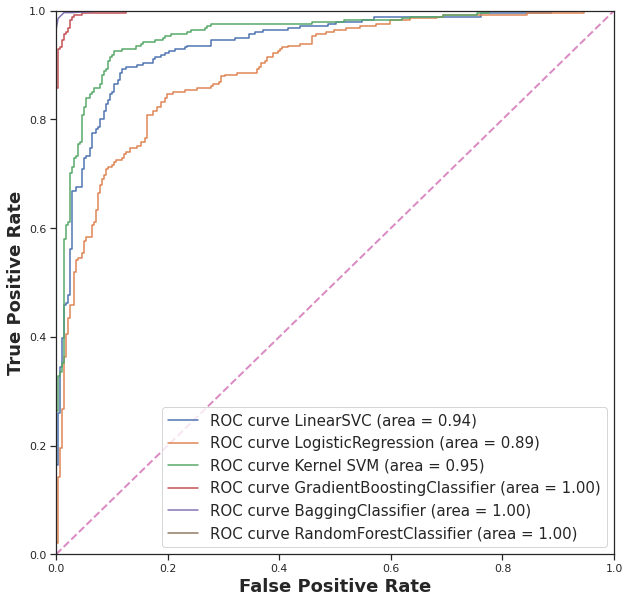

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

LinearSVM acc: 0.8473282442748091
              precision    recall  f1-score   support

           0       0.81      0.84      0.82        55
           1       0.88      0.86      0.87        76

    accuracy                           0.85       131
   macro avg       0.84      0.85      0.84       131
weighted avg       0.85      0.85      0.85       131

LogisticRegression acc: 0.7938931297709924
              precision    recall  f1-score   support

           0       0.83      0.64      0.72        55
           1       0.78      0.91      0.84        76

    accuracy                           0.79       131
   macro avg       0.80      0.77      0.78       131
weighted avg       0.80      0.79      0.79       131

              precision    recall  f1-score   support

           0       0.80      0.82      0.81        55
           1       0.87      0.86      0.86        76

    accuracy                           0.84       131
   macro avg       0.84      0.84      0.84       1

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


GradientBoostingClassifier acc: 0.816793893129771
              precision    recall  f1-score   support

           0       0.77      0.80      0.79        55
           1       0.85      0.83      0.84        76

    accuracy                           0.82       131
   macro avg       0.81      0.81      0.81       131
weighted avg       0.82      0.82      0.82       131

BaggingClassifier acc: 0.816793893129771
              precision    recall  f1-score   support

           0       0.75      0.85      0.80        55
           1       0.88      0.79      0.83        76

    accuracy                           0.82       131
   macro avg       0.81      0.82      0.81       131
weighted avg       0.83      0.82      0.82       131

RandomForestClassifier acc: 0.8396946564885496
              precision    recall  f1-score   support

           0       0.79      0.84      0.81        55
           1       0.88      0.84      0.86        76

    accuracy                           0.84 

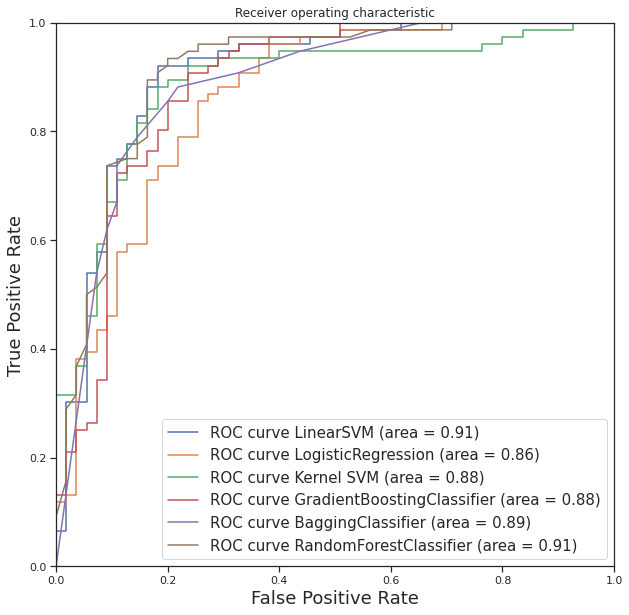

In [ ]:
# Test Set wiht SMOTE

X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))



randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))
print(classification_report(y_test_clean, y_pred))


#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)

## GM-SMOTE + Benchmarks

In [ ]:
data_train_resampled = Oversample_Minority(data_train, n_components_res= 1)
data_train_resampled_denoised = Remove_Outliers(data_train_resampled, threshold = 0.985)
data_train_resampled_denoised.Default = data_train_resampled_denoised.Default.astype(int)

X_res = data_train_resampled_denoised.loc[:,data.columns != 'Default']
y_res = data_train_resampled_denoised.loc[:,data.columns == 'Default']


------------- Over Sampling -------------
Number of Components: 1
Before oversampling
{0: 241, 1: 281}
After oversampling
{0: 281, 1: 281}
-----------------Denoising-----------------------
Zero Observations: 281 Denoised: 5 Ratio: 1.7793594306049825
Ones Observations: 281 Denoised: 5 Ratio: 1.7793594306049825


LinearSVM acc: 0.875
LogisticRegression acc: 0.8297101449275363


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  ext

              precision    recall  f1-score   support

           0       0.92      0.91      0.91       276
           1       0.91      0.92      0.91       276

    accuracy                           0.91       552
   macro avg       0.91      0.91      0.91       552
weighted avg       0.91      0.91      0.91       552

GradientBoostingClassifier acc: 0.980072463768116
BaggingClassifier acc: 0.9891304347826086


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:69: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestClassifier acc: 1.0


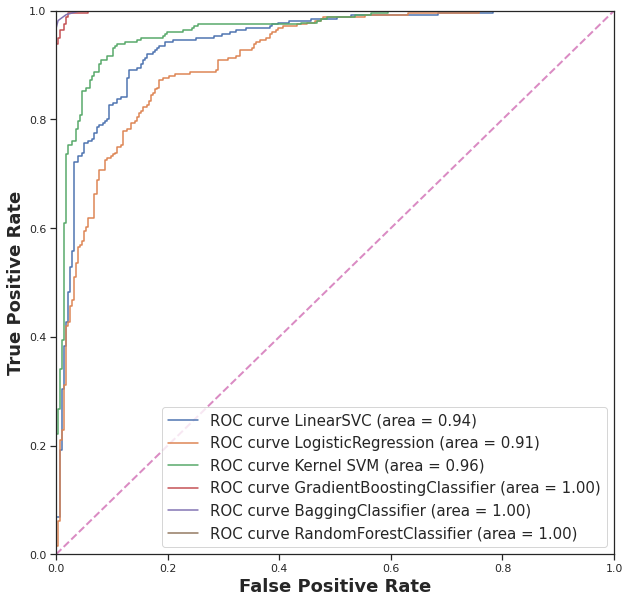

In [ ]:
#Train Set
plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_res, y_res)
y_pred_svc = lin_svc.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVC (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_res)
print('LinearSVM acc:', accuracy_score(y_res, y_pred))


logreg = LogisticRegression(random_state=0).fit(X_res, y_res)
y_pred_logreg = logreg.decision_function(X_res)
fpr, tpr, _ = roc_curve(y_res, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_res)
print('LogisticRegression acc:', accuracy_score(y_res, y_pred))


sc = StandardScaler()
X_train = sc.fit_transform(X_res)


svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_res)
y_pred_svc2 = svc2.decision_function(X_train)
fpr, tpr, _ = roc_curve(y_res, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_train)
print(classification_report(y_res, y_pred))


gbclf = GradientBoostingClassifier(random_state=0).fit(X_res, y_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_res)

fpr, tpr, _ = roc_curve(y_res, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_res)
print('GradientBoostingClassifier acc:', accuracy_score(y_res, y_pred))


bclf = BaggingClassifier(random_state=0).fit(X_res, y_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_res)
print('BaggingClassifier acc:', accuracy_score(y_res, y_pred))

randomforest = RandomForestClassifier(random_state=0).fit(X_res, y_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_res)


fpr, tpr, _ = roc_curve(y_res, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_res)
print('RandomForestClassifier acc:', accuracy_score(y_res, y_pred))





plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',  fontweight='bold', fontsize = 18)
plt.ylabel('True Positive Rate', fontweight='bold', fontsize = 18)
#plt.title('Receiver operating characteristic')
plt.legend(loc="lower right",  fontsize = 15)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  ext

LinearSVM acc: 0.8244274809160306
LogisticRegression acc: 0.8015267175572519
              precision    recall  f1-score   support

           0       0.82      0.85      0.84        55
           1       0.89      0.87      0.88        76

    accuracy                           0.86       131
   macro avg       0.86      0.86      0.86       131
weighted avg       0.86      0.86      0.86       131

GradientBoostingClassifier acc: 0.816793893129771


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:83: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


BaggingClassifier acc: 0.8625954198473282
RandomForestClassifier acc: 0.8549618320610687


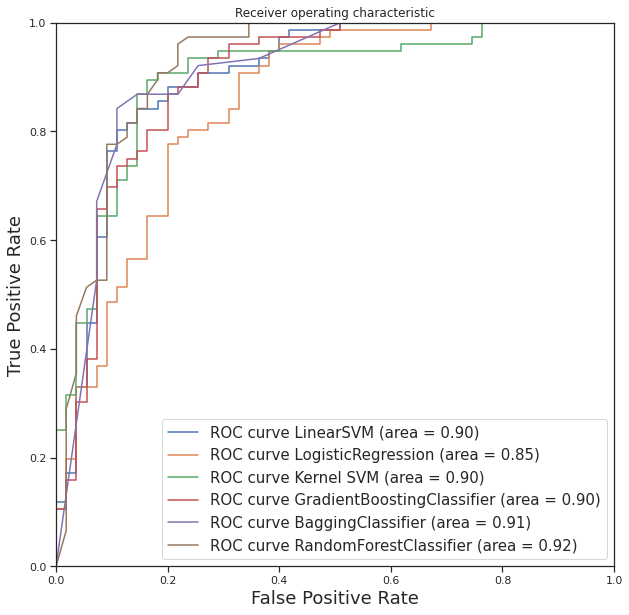

In [ ]:


X_train_clean_res = X_res
y_train_clean_res = y_res
X_test_clean = data_test.loc[:,data.columns != 'Default']
y_test_clean = data_test.loc[:,data.columns == 'Default']



plt.figure(figsize = (10, 10))
fpr = dict()
tpr = dict()
roc_auc = dict()
lw = 2

lin_svc = svm.LinearSVC(class_weight="balanced",dual=False).fit(X_train_clean_res, y_train_clean_res)
y_pred_svc = lin_svc.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LinearSVM (area = %0.2f)' % roc_auc)
y_pred = lin_svc.predict(X_test_clean)
print('LinearSVM acc:', accuracy_score(y_test_clean, y_pred))



logreg = LogisticRegression(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_logreg = logreg.decision_function(X_test_clean)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_logreg)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve LogisticRegression (area = %0.2f)' % roc_auc)
y_pred = logreg.predict(X_test_clean)
print('LogisticRegression acc:', accuracy_score(y_test_clean, y_pred))




sc = StandardScaler()
X_train = sc.fit_transform(X_train_clean_res)
X_test = sc.transform(X_test_clean)
svc2 = svm.SVC(kernel='rbf',  random_state = 42).fit(X_train, y_train_clean_res)
y_pred_svc2 = svc2.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test_clean, y_pred_svc2)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr,
        label='ROC curve Kernel SVM (area = %0.2f)' % roc_auc)
y_pred = svc2.predict(X_test)
print(classification_report(y_test_clean, y_pred))



gbclf = GradientBoostingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_GradientBoostingClassifier = gbclf.decision_function(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_GradientBoostingClassifier)
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
plt.plot(fpr, tpr,
          label='ROC curve GradientBoostingClassifier (area = %0.2f)' % roc_auc)
y_pred = gbclf.predict(X_test_clean)
print('GradientBoostingClassifier acc:', accuracy_score(y_test_clean, y_pred))



bclf = BaggingClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_BaggingClassifier = bclf.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_BaggingClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve

plt.plot(fpr, tpr,
          label='ROC curve BaggingClassifier (area = %0.2f)' % roc_auc)
y_pred = bclf.predict(X_test_clean)
print('BaggingClassifier acc:', accuracy_score(y_test_clean, y_pred))




randomforest = RandomForestClassifier(random_state=0).fit(X_train_clean_res, y_train_clean_res)
y_pred_RandomForestClassifier = randomforest.predict_proba(X_test_clean)

fpr, tpr, _ = roc_curve(y_test_clean, y_pred_RandomForestClassifier[:, 1])
roc_auc = auc(fpr, tpr)
#Plot of a ROC curve
lw = 2
plt.plot(fpr, tpr,
          label='ROC curve RandomForestClassifier (area = %0.2f)' % roc_auc)
y_pred = randomforest.predict(X_test_clean)
print('RandomForestClassifier acc:', accuracy_score(y_test_clean, y_pred))



#plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate',   fontsize = 18)
plt.ylabel('True Positive Rate',  fontsize = 18)
plt.title('Receiver operating characteristic')

plt.legend(loc="lower right",  fontsize = 15)